#  Exploring the Raw Satellite Images in SpaceNet 7

---

##  **General Explanation of the Images**
The **"images"** folder contains **24 monthly satellite images** for a specific **Area of Interest (AOI)** over **two years**. Each image is stored in **GeoTIFF (`.tif`) format** and has:

- **Resolution:** Either **1024×1024** or **1024×1023** pixels.
- **Channels:** **RGBA (Red, Green, Blue, Alpha)**
- **Projection:** EPSG:3857 (Web Mercator).


---

### **What is RGBA?**
- **Red (R), Green (G), and Blue (B):** Represent the color components of the image.
- **Alpha (A) Channel:** Represents transparency or masked areas:
  - A value of **255** (white) means **fully visible**.
  - A value of **0** (black) means **fully transparent (masked).**
  - Intermediate values represent **partial transparency**.

These images provide **multi-temporal observations**, allowing us to track **urban development, deforestation, or other land changes** over time.



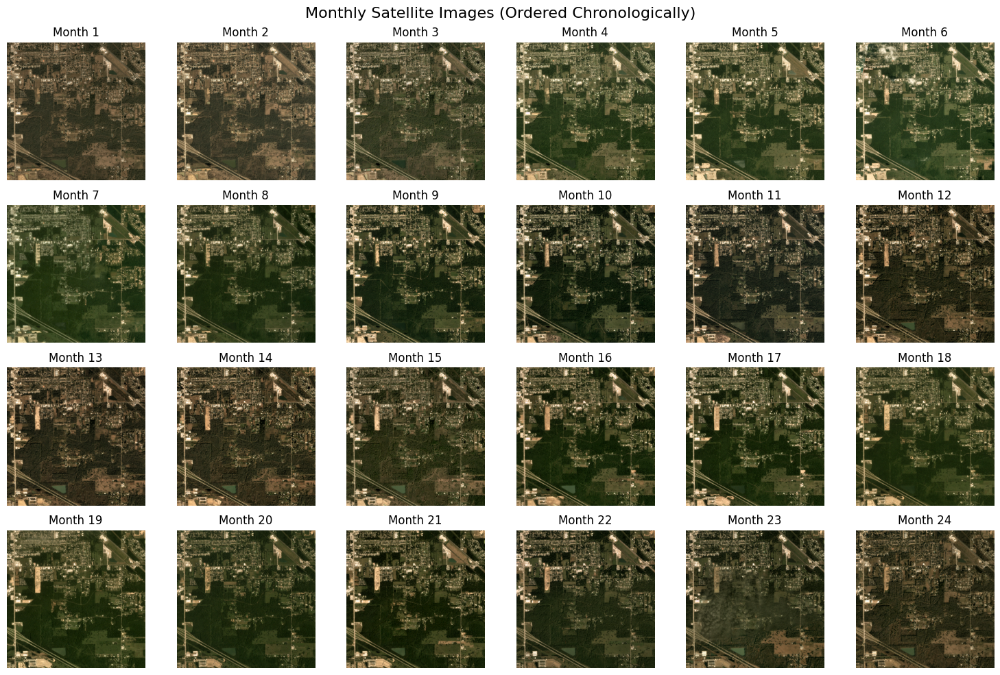

In [31]:
import os
import rasterio
import matplotlib.pyplot as plt
import glob
import numpy as np

# Convert Windows path to WSL path
image_folder = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train_sample/sample/L15-0506E-1204N_2027_3374_13/images"

# Get all .tif images sorted by month
image_files = sorted(glob.glob(os.path.join(image_folder, "*.tif")))

# Number of images
num_images = len(image_files)

# Define grid size dynamically based on number of images
rows = (num_images // 6) + (1 if num_images % 6 != 0 else 0)
cols = min(6, num_images)

# Create the figure
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
fig.suptitle("Monthly Satellite Images (Ordered Chronologically)", fontsize=16)

# Ensure axes is always a 2D array
axes = np.array(axes)
axes = axes.reshape(rows, cols)

# Loop through images and display them
for i, img_path in enumerate(image_files):
    try:
        with rasterio.open(img_path) as src:
            img = src.read([1, 2, 3])  # Read RGB channels
        
        row, col = divmod(i, 6)
        axes[row, col].imshow(img.transpose(1, 2, 0))  # Correct channel ordering
        axes[row, col].set_title(f"Month {i+1}")
        axes[row, col].axis("off")
    
    except Exception as e:
        print(f"Error loading {img_path}: {e}")
        axes[row, col].axis("off")
        axes[row, col].set_title(f"Error {i+1}")

# Remove empty subplots (if any)
for i in range(num_images, rows * cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()


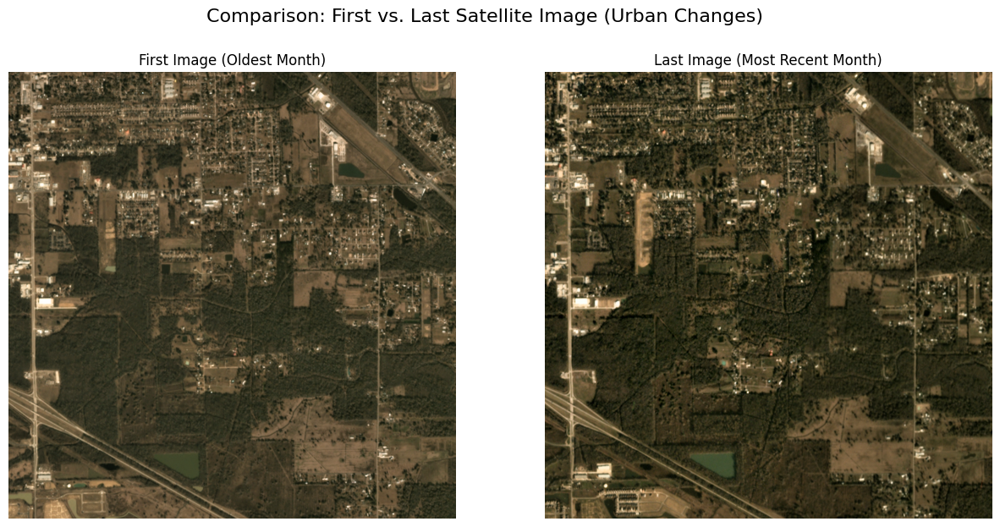

In [32]:
import rasterio
import matplotlib.pyplot as plt

# Select first and last image paths
first_image_path = image_files[0]  # First month
last_image_path = image_files[-1]  # Last month

# Load the first image
with rasterio.open(first_image_path) as src:
    first_img = src.read([1, 2, 3])  # Read RGB channels

# Load the last image
with rasterio.open(last_image_path) as src:
    last_img = src.read([1, 2, 3])  # Read RGB channels

# Plot the two images side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# First image
axes[0].imshow(first_img.transpose(1, 2, 0))  # Transpose for Matplotlib
axes[0].set_title("First Image (Oldest Month)")
axes[0].axis("off")

# Last image
axes[1].imshow(last_img.transpose(1, 2, 0))  # Transpose for Matplotlib
axes[1].set_title("Last Image (Most Recent Month)")
axes[1].axis("off")

# Add a main title
plt.suptitle("Comparison: First vs. Last Satellite Image (Urban Changes)", fontsize=16)
plt.show()


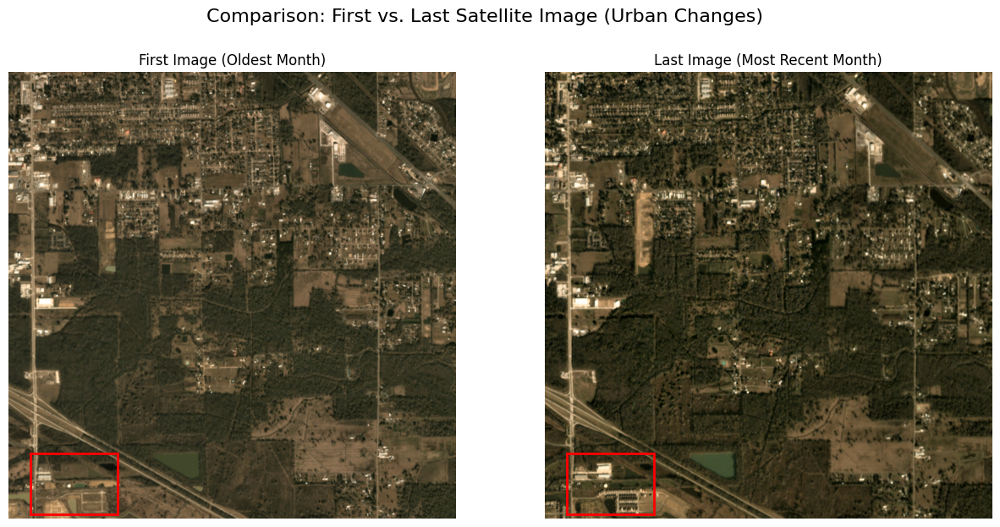

In [33]:
import rasterio
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Select first and last image paths
first_image_path = image_files[0]  # First month
last_image_path = image_files[-1]  # Last month

# Load the first image
with rasterio.open(first_image_path) as src:
    first_img = src.read([1, 2, 3])  # Read RGB channels

# Load the last image
with rasterio.open(last_image_path) as src:
    last_img = src.read([1, 2, 3])  # Read RGB channels

# Define the bounding box for the bottom-left region
rect_x = 50  # Adjust the x-coordinate of the rectangle
rect_y = first_img.shape[1] - 150  # Adjust the y-coordinate
rect_width = 200  # Width of the rectangle
rect_height = 140  # Height of the rectangle

# Plot the two images side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# First image
axes[0].imshow(first_img.transpose(1, 2, 0))  # Transpose for Matplotlib
axes[0].set_title("First Image (Oldest Month)")
axes[0].axis("off")

# Draw a rectangle to highlight the changed area
rect1 = patches.Rectangle((rect_x, rect_y), rect_width, rect_height, linewidth=2, edgecolor='red', facecolor='none')
axes[0].add_patch(rect1)

# Last image
axes[1].imshow(last_img.transpose(1, 2, 0))  # Transpose for Matplotlib
axes[1].set_title("Last Image (Most Recent Month)")
axes[1].axis("off")

# Draw a rectangle in the same location on the last image
rect2 = patches.Rectangle((rect_x, rect_y), rect_width, rect_height, linewidth=2, edgecolor='red', facecolor='none')
axes[1].add_patch(rect2)

# Add a main title
plt.suptitle("Comparison: First vs. Last Satellite Image (Urban Changes)", fontsize=16)
plt.show()


## Observations on Image Changes

In this specific image, there aren't many noticeable changes visible to the naked eye. However, I have marked the differences between the first and last images using a **red rectangle**, highlighting subtle developments in the area. While this region shows only **minor modifications**, other images in the dataset exhibit far more **significant changes over time**.  

It will be particularly interesting to analyze how our **model processes and distinguishes** between images with **minimal transformation** versus those with **dramatic urban expansion**. Observing its performance across varying levels of change will help us assess its **robustness and adaptability** to different scenarios.  


----

## Observations on Masked Images

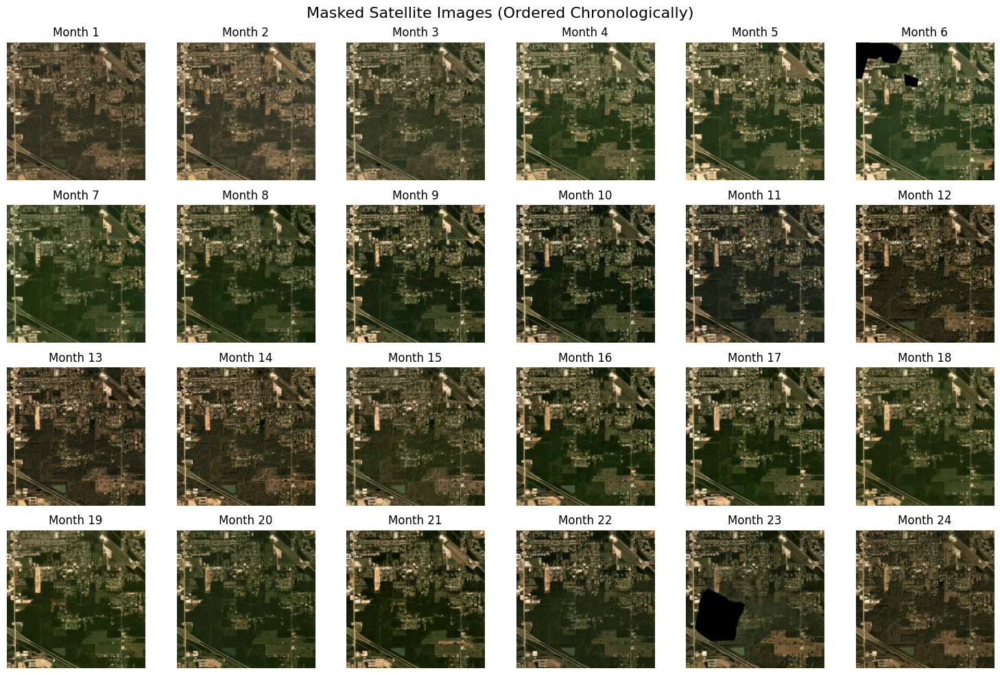

In [34]:
import os
import rasterio
import matplotlib.pyplot as plt
import glob
import numpy as np

# Convert Windows path to WSL path for the "images_masked" folder
masked_image_folder = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train_sample/sample/L15-0506E-1204N_2027_3374_13/images_masked"

# Get all .tif images sorted by month
masked_image_files = sorted(glob.glob(os.path.join(masked_image_folder, "*.tif")))

# Number of images
num_masked_images = len(masked_image_files)

# Define grid size dynamically based on number of images
rows = (num_masked_images // 6) + (1 if num_masked_images % 6 != 0 else 0)
cols = min(6, num_masked_images)

# Create the figure
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
fig.suptitle("Masked Satellite Images (Ordered Chronologically)", fontsize=16)

# Ensure axes is always a 2D array
axes = np.array(axes)
axes = axes.reshape(rows, cols)

# Loop through images and display them
for i, img_path in enumerate(masked_image_files):
    try:
        with rasterio.open(img_path) as src:
            img = src.read([1, 2, 3])  # Read RGB channels

        row, col = divmod(i, 6)
        axes[row, col].imshow(img.transpose(1, 2, 0))  # Correct channel ordering
        axes[row, col].set_title(f"Month {i+1}")
        axes[row, col].axis("off")

    except Exception as e:
        print(f"Error loading {img_path}: {e}")
        axes[row, col].axis("off")
        axes[row, col].set_title(f"Error {i+1}")

# Remove empty subplots (if any)
for i in range(num_masked_images, rows * cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()


## Observations on Masked Data

In the sample area we selected, the dataset includes **masked images for months 6 and 23**. The **images_masked** folder contains satellite images where **unusable portions** of the data have been masked out, typically due to **cloud cover or other obstructions**. These images are provided in the **EPSG:3857 projection** for consistency with the dataset.  

When we train our models at a later stage, we may need to **introduce additional masking** for more months, depending on the **specific objectives** of our models. This will help ensure that the model learns to handle missing or obstructed data effectively, improving its **robustness and generalization** to real-world conditions.


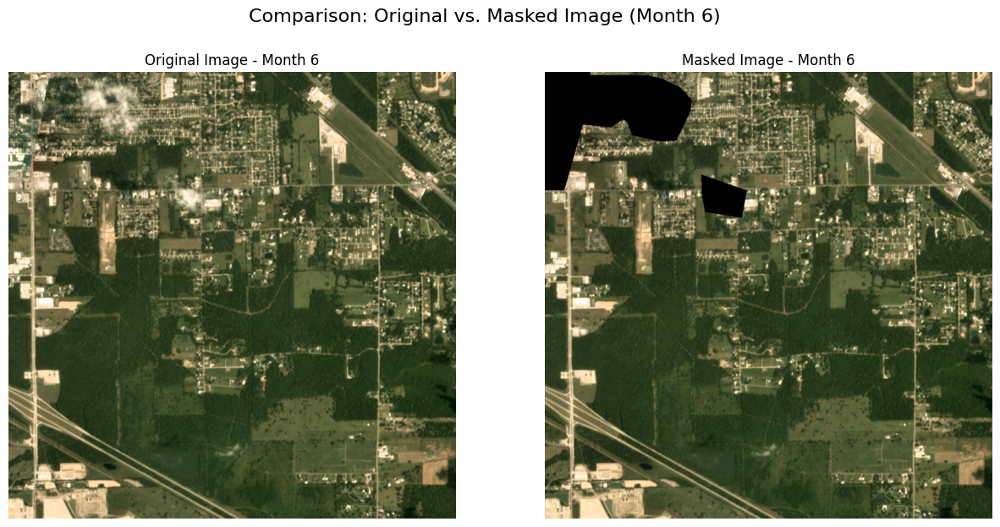

In [35]:
import rasterio
import matplotlib.pyplot as plt

# Select the paths for image 6 (June)
original_image_path = image_files[5]  # Index 5 corresponds to month 6
masked_image_path = masked_image_files[5]  # Index 5 corresponds to month 6

# Load the original image
with rasterio.open(original_image_path) as src:
    original_img = src.read([1, 2, 3])  # Read RGB channels

# Load the masked image
with rasterio.open(masked_image_path) as src:
    masked_img = src.read([1, 2, 3])  # Read RGB channels

# Plot side by side for comparison
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# Original Image
axes[0].imshow(original_img.transpose(1, 2, 0))  # Transpose for correct display
axes[0].set_title("Original Image - Month 6")
axes[0].axis("off")

# Masked Image
axes[1].imshow(masked_img.transpose(1, 2, 0))  # Transpose for correct display
axes[1].set_title("Masked Image - Month 6")
axes[1].axis("off")

# Add a main title
plt.suptitle("Comparison: Original vs. Masked Image (Month 6)", fontsize=16)
plt.show()


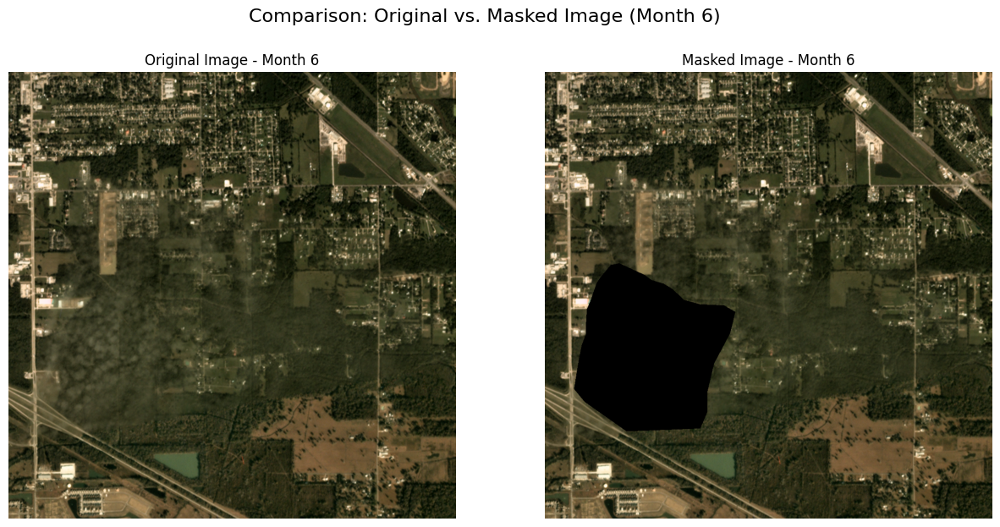

In [36]:
import rasterio
import matplotlib.pyplot as plt

# Select the paths for image 6 (June)
original_image_path = image_files[22]  # Index 5 corresponds to month 6
masked_image_path = masked_image_files[22]  # Index 5 corresponds to month 6

# Load the original image
with rasterio.open(original_image_path) as src:
    original_img = src.read([1, 2, 3])  # Read RGB channels

# Load the masked image
with rasterio.open(masked_image_path) as src:
    masked_img = src.read([1, 2, 3])  # Read RGB channels

# Plot side by side for comparison
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# Original Image
axes[0].imshow(original_img.transpose(1, 2, 0))  # Transpose for correct display
axes[0].set_title("Original Image - Month 6")
axes[0].axis("off")

# Masked Image
axes[1].imshow(masked_img.transpose(1, 2, 0))  # Transpose for correct display
axes[1].set_title("Masked Image - Month 6")
axes[1].axis("off")

# Add a main title
plt.suptitle("Comparison: Original vs. Masked Image (Month 6)", fontsize=16)
plt.show()


---
## Understanding the Label Data in SpaceNet 7



The **label data** in the SpaceNet 7 dataset provides crucial ground truth information for tracking urban development over time. These labels define **building footprints** and their unique **identifiers (IDs)** for each month, allowing us to analyze how cities grow and change. The dataset includes multiple components:  

- **`labels/`** → This folder contains the **raw building footprint labels**, outlining the shape and location of each structure in **EPSG:4326 projection (latitude/longitude coordinates)**. Additionally, it includes **Unusable Data Mask (UDM) labels**, which identify areas where data is missing or unreliable (e.g., due to cloud cover).  
- **`labels_match/`** → These are **reprojected building footprints**, meaning they are adjusted to align with the satellite images in **EPSG:3857 projection**. This ensures that the footprints correctly overlay onto the image tiles, making it easier to match them with satellite observations.  
- **`labels_match_pix/`** → The building footprints in this folder are converted into **pixel coordinates**, aligning them with the satellite images at a pixel level. This transformation allows direct application of deep learning models that use pixel-based segmentation or detection techniques.  
- **`UDM_masks/`** → This folder contains the **Unusable Data Masks (UDMs)** rendered as **binary mask images**. These masks highlight regions where data is unreliable, such as cloud-covered areas, ensuring that these regions can be excluded from training or analysis when needed.  

Each label file is stored in **GeoJSON format**, where every building is represented as a **polygon** with its coordinates and a unique **building ID** that remains consistent across different months. By using this structured data, we can track the **evolution of individual buildings** and identify urban expansion patterns over time. These components are essential for training models that **detect, segment, and analyze buildings** in satellite imagery, making them a key part of the dataset’s value.

---
### labels
Each **region** in the dataset contains **24 months** of data. For **each month**, there are **two GeoJSON files**:

1. **Buildings file (`*_Buildings.geojson`)** → Contains labeled building footprints as polygons.
2. **UDM file (`*_UDM.geojson`)** → Represents **Unusable Data Masks (UDM)**, indicating areas where data is **unreliable or missing** (e.g., cloud cover).

The script below retrieves and prints the **label files** from the dataset, from the **`labels/`** folder.


In [37]:
import os
import geopandas as gpd
import glob
import json

# Define path to labels folder
labels_folder = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train_sample/sample/L15-0506E-1204N_2027_3374_13/labels"

# Get all GeoJSON label files
label_files = sorted(glob.glob(os.path.join(labels_folder, "*.geojson")))

# Print all label file names
print("Label Files in the sample Dataset:")
print(f"    {os.path.basename(label_files[0])}")
print(f"    {os.path.basename(label_files[1])}")
print(f"    {os.path.basename(label_files[2])}")
print(f"    {os.path.basename(label_files[3])}")
print(f"    ...")

Label Files in the sample Dataset:
    global_monthly_2018_01_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson
    global_monthly_2018_01_mosaic_L15-0506E-1204N_2027_3374_13_UDM.geojson
    global_monthly_2018_02_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson
    global_monthly_2018_02_mosaic_L15-0506E-1204N_2027_3374_13_UDM.geojson
    ...


In [38]:
# Load a sample label file
if label_files:
    sample_label_path = label_files[0]  # Load first file
    gdf = gpd.read_file(sample_label_path)

    # Print the first few rows to see building footprints
    print("\nSample Label Data (First 5 Entries):")
    print(gdf.head())


Sample Label Data (First 5 Entries):
   Id                                           geometry
0   0  POLYGON ((-90.88718 30.18332, -90.8873 30.1833...
1   0  POLYGON ((-90.88593 30.18331, -90.8861 30.1833...
2   0  POLYGON ((-90.88546 30.18332, -90.88563 30.183...
3   0  POLYGON ((-90.8875 30.18333, -90.88765 30.1833...
4   0  POLYGON ((-90.88497 30.18343, -90.88516 30.183...


In [39]:
# Load a sample label file
if label_files:
    # Print full JSON structure of the first label entry
    with open(sample_label_path, "r") as f:
        sample_json = json.load(f)

    print("\n Sample GeoJSON Structure:")
    print(json.dumps(sample_json["features"][:2], indent=4))  # Show first two buildings

else:
    print("No label files found in the folder.")


 Sample GeoJSON Structure:
[
    {
        "type": "Feature",
        "properties": {
            "Id": 0
        },
        "geometry": {
            "type": "Polygon",
            "coordinates": [
                [
                    [
                        -90.88718197057491,
                        30.183318176153602
                    ],
                    [
                        -90.88730076827964,
                        30.18331623795269
                    ],
                    [
                        -90.88730373900829,
                        30.18345235221234
                    ],
                    [
                        -90.88718494130354,
                        30.18345428963417
                    ],
                    [
                        -90.88718197057491,
                        30.183318176153602
                    ]
                ]
            ]
        }
    },
    {
        "type": "Feature",
        "properties": {
            "Id": 0


---
### labels_match

The **`labels_match`** folder contains reprojected building footprint labels that align with the satellite images. Unlike the raw labels in the **`labels/`** folder, these labels are transformed to match the **EPSG:3857 projection**, which is the same coordinate reference system (CRS) used in the imagery.

Each **region** in the dataset contains **24 months** of data. For **each month**, there is one **GeoJSON file** that includes:
- **Reprojected building footprints** aligned with the corresponding satellite image.
- **A unique identifier (ID) for each building** that remains consistent across different months.

The script below retrieves and prints the **label files** from the **`labels_match/`** folder, helping us verify the dataset's structure and contents before further processing.


In [40]:
import os
import geopandas as gpd
import glob
import json

# Define path to labels_match folder
labels_match_folder = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train_sample/sample/L15-0506E-1204N_2027_3374_13/labels_match"

# Get all GeoJSON label files
labels_match_files = sorted(glob.glob(os.path.join(labels_match_folder, "*.geojson")))

# Print all label file names
print("Label Files in the `labels_match` Folder:")
print(f"    {os.path.basename(labels_match_files[0])}")
print(f"    {os.path.basename(labels_match_files[1])}")
print(f"    {os.path.basename(labels_match_files[2])}")
print(f"    {os.path.basename(labels_match_files[3])}")
print(f"    ...")

Label Files in the `labels_match` Folder:
    global_monthly_2018_01_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson
    global_monthly_2018_02_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson
    global_monthly_2018_03_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson
    global_monthly_2018_04_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson
    ...


In [41]:
# Load a sample label file
if labels_match_files:
    sample_label_match_path = labels_match_files[0]  # Load first file
    gdf_match = gpd.read_file(sample_label_match_path)

    # Print the first few rows to see building footprints
    print("\nSample Label Data (First 5 Entries):")
    print(gdf_match.head())


Sample Label Data (First 5 Entries):
   Id         area  iou_score  \
0   0  7797.403072          0   
1   1  4199.716038          0   
2   2  4087.709099          0   
3   3  3942.940783          0   
4   4  3878.821424          0   

                                            geometry  
0  POLYGON ((-10121023.281 3529457.088, -10121149...  
1  POLYGON ((-10121024.661 3527551.89, -10121159....  
2  POLYGON ((-10117881.863 3531293.186, -10117907...  
3  POLYGON ((-10120998.1 3530527.449, -10121040.4...  
4  POLYGON ((-10119689.207 3531808.395, -10119689...  


In [42]:
if labels_match_files:
    # Print full JSON structure of the first label entry
    with open(sample_label_match_path, "r") as f:
        sample_json_match = json.load(f)

    print("\nSample GeoJSON Structure:")
    print(json.dumps(sample_json_match["features"][:2], indent=4))  # Show first two buildings

else:
    print("No label files found in the folder.")



Sample GeoJSON Structure:
[
    {
        "type": "Feature",
        "properties": {
            "Id": 0,
            "area": 7797.4030716223815,
            "iou_score": 0
        },
        "geometry": {
            "type": "Polygon",
            "coordinates": [
                [
                    [
                        -10121023.281199988,
                        3529457.0880000032
                    ],
                    [
                        -10121149.223099994,
                        3529457.0880000032
                    ],
                    [
                        -10121149.223099994,
                        3529519.0006999965
                    ],
                    [
                        -10121023.281199988,
                        3529519.0006999965
                    ],
                    [
                        -10121023.281199988,
                        3529457.0880000032
                    ]
                ]
            ]
        }
    },
  

---
### labels_match_pix

The **`labels_match_pix`** folder contains **building footprints converted into pixel coordinates**, aligning them **directly with the satellite images**. Unlike `labels/`, which stores footprints in latitude/longitude (EPSG:4326), and `labels_match/`, which reprojects them to Web Mercator (EPSG:3857), this folder **translates building footprints into pixel space**.

Each **region** contains **24 months** of data, with one **GeoJSON file per month**, containing:
- **Pixel coordinates of each building footprint**, instead of geographical coordinates.
- **A unique identifier (ID) for each building**, which remains consistent over time.

This transformation is critical for **deep learning models** that operate at the **pixel level** rather than using geographic coordinates. By using `labels_match_pix/`, we ensure that our labels perfectly match the **structure and scale of the satellite images**, making them **ideal for segmentation tasks**.

The script below retrieves and prints the **label files** from the `labels_match_pix/` folder, helping us verify the dataset's structure before further analysis.

In [43]:
import os
import geopandas as gpd
import glob
import json

# Define path to labels_match_pix folder
labels_match_pix_folder = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train_sample/sample/L15-0506E-1204N_2027_3374_13/labels_match_pix"

# Get all GeoJSON label files
labels_match_pix_files = sorted(glob.glob(os.path.join(labels_match_pix_folder, "*.geojson")))

# Print all label file names
print("Label Files in the `labels_match_pix` Folder:")
print(f"    {os.path.basename(labels_match_pix_files[0])}")
print(f"    {os.path.basename(labels_match_pix_files[1])}")
print(f"    {os.path.basename(labels_match_pix_files[2])}")
print(f"    {os.path.basename(labels_match_pix_files[3])}")
print(f"    ...")

Label Files in the `labels_match_pix` Folder:
    global_monthly_2018_01_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson
    global_monthly_2018_02_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson
    global_monthly_2018_03_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson
    global_monthly_2018_04_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson
    ...


In [44]:
# Load a sample label file
if labels_match_pix_files:
    sample_label_pix_path = labels_match_pix_files[0]  # Load first file
    gdf_match_pix = gpd.read_file(sample_label_pix_path)

    # Print the first few rows to see pixel-based building footprints
    print("\nSample Label Data (First 5 Entries):")
    print(gdf_match_pix.head())


Sample Label Data (First 5 Entries):
     Id        area                                        image_fname  \
0  2142   99.546570  global_monthly_2018_01_mosaic_L15-0506E-1204N_...   
1  1494  224.788213  global_monthly_2018_01_mosaic_L15-0506E-1204N_...   
2   538  385.165421  global_monthly_2018_01_mosaic_L15-0506E-1204N_...   
3  1457  230.595219  global_monthly_2018_01_mosaic_L15-0506E-1204N_...   
4  1438  231.855302  global_monthly_2018_01_mosaic_L15-0506E-1204N_...   

                                            geometry  
0  POLYGON ((988.53811 218.49469, 987.04276 220.3...  
1  POLYGON ((990.59771 215.49741, 991.70851 216.5...  
2  POLYGON ((1020.83156 215.04849, 1017.50856 217...  
3  POLYGON ((1008.05659 210.71472, 1005.12201 211...  
4  POLYGON ((987.60701 209.40523, 985.91136 211.2...  


In [45]:
# Load a sample label file
if labels_match_pix_files:
    # Print full JSON structure of the first label entry
    with open(sample_label_pix_path, "r") as f:
        sample_json_match_pix = json.load(f)

    print("\nSample GeoJSON Structure:")
    print(json.dumps(sample_json_match_pix["features"][:2], indent=4))  # Show first two buildings

else:
    print("No label files found in the folder.")



Sample GeoJSON Structure:
[
    {
        "type": "Feature",
        "properties": {
            "Id": 2142,
            "area": 99.54657001404804,
            "image_fname": "global_monthly_2018_01_mosaic_L15-0506E-1204N_2027_3374_13.tif"
        },
        "geometry": {
            "type": "Polygon",
            "coordinates": [
                [
                    [
                        988.5381104093976,
                        218.49469063791912
                    ],
                    [
                        987.0427588606253,
                        220.3223425328033
                    ],
                    [
                        985.6132093607448,
                        219.15271112206392
                    ],
                    [
                        987.1085609081201,
                        217.325059232302
                    ],
                    [
                        988.5381104093976,
                        218.49469063791912
                   

---

###  UDM_masks

The **`UDM_masks`** folder contains **Unusable Data Masks (UDMs)** rendered as **binary mask images**. These masks indicate regions in the satellite images where the data is **unreliable or missing**, typically due to **cloud cover, sensor errors, or other obstructions**.

Each **region** contains **24 months** of data, and for some months, **masked regions are present**. The masks are stored in **GeoTIFF (`.tif`) format**, making them easy to overlay on the images.

Each **UDM mask** is a **grayscale image**, where:
- **0 (black)** = Valid data (usable parts of the image).
- **1 (white or bright pixels)** = Invalid data (cloud cover, obstructions).

These masks are crucial for **data preprocessing** since they help us **ignore unreliable regions** when training machine learning models.

The script below retrieves and prints the **UDM mask files** from the `UDM_masks/` folder, loads a sample mask, and displays it to better understand its structure.

In [46]:
import os
import rasterio
import matplotlib.pyplot as plt
import glob


# Define path to UDM_masks folder
UDM_masks_folder = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train_sample/sample/L15-0506E-1204N_2027_3374_13/UDM_masks"

# Get all UDM mask `.tif` files
UDM_mask_files = sorted(glob.glob(os.path.join(UDM_masks_folder, "*.tif")))

# Print all UDM mask filenames
print("UDM Mask Files in the Dataset:")
print(f"    {os.path.basename(UDM_mask_files[0])}")
print(f"    {os.path.basename(UDM_mask_files[1])}")

UDM Mask Files in the Dataset:
    global_monthly_2018_06_mosaic_L15-0506E-1204N_2027_3374_13_UDM.tif
    global_monthly_2019_11_mosaic_L15-0506E-1204N_2027_3374_13_UDM.tif


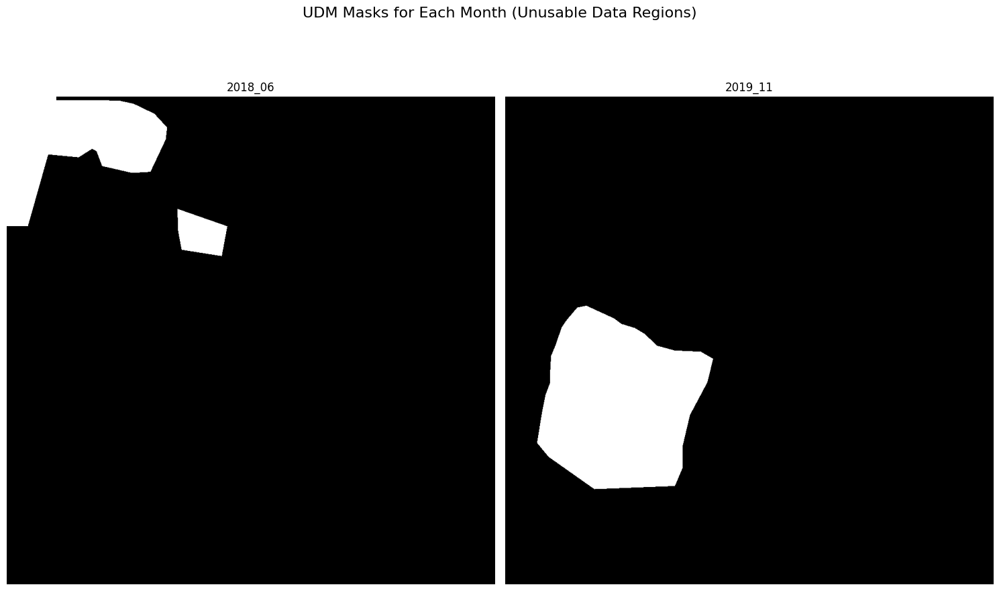

In [47]:
import numpy as np
# Number of images
num_masks = len(UDM_mask_files)

# Define grid size dynamically based on number of images
rows = (num_masks // 6) + (1 if num_masks % 6 != 0 else 0)
cols = min(6, num_masks)

# Create the figure
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
fig.suptitle("UDM Masks for Each Month (Unusable Data Regions)", fontsize=16)

# Ensure axes is always a 2D array
axes = np.array(axes)
axes = axes.reshape(rows, cols)

# Loop through UDM masks and display them
for i, mask_path in enumerate(UDM_mask_files):
    try:
        with rasterio.open(mask_path) as src:
            mask_img = src.read(1)  # Read as grayscale mask

        # Extract month from filename (assuming format: global_monthly_YYYY_MM...)
        filename = os.path.basename(mask_path)
        month = filename.split("_")[2] + "_" + filename.split("_")[3]  # Extract YYYY_MM

        row, col = divmod(i, 6)
        axes[row, col].imshow(mask_img, cmap="gray")  # Display in grayscale
        axes[row, col].set_title(f"{month}")  # Set title with month
        axes[row, col].axis("off")

    except Exception as e:
        print(f"Error loading {mask_path}: {e}")
        axes[row, col].axis("off")
        axes[row, col].set_title(f"Error {i+1}")

# Remove empty subplots (if any)
for i in range(num_masks, rows * cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()


## Understanding sn7_train_ground_truth_pix.csv

The `sn7_train_ground_truth_pix.csv` file contains **building footprint labels** in pixel space for each training image. This dataset is essential for tracking **urban development over time** and aligning **ground truth building locations** with satellite imagery.

Each row in the dataset corresponds to a **building footprint**, uniquely identified and mapped to an image. The data is structured as follows:

- **`filename`** → The image file corresponding to the labeled footprints.
- **`id`** → A unique identifier for each building, ensuring consistency across time.
- **`geometry`** → A polygon representing the building footprint in **pixel coordinates** (rather than latitude/longitude).

Since the dataset is **very large**, we will conduct an **Exploratory Data Analysis (EDA)** on a **small sample** to:

**Understand the structure of the data** (column names, data types, missing values).
**Visualize building footprints in pixel space** to check alignment with images.
**Detect inconsistencies or missing data** before training machine learning models.

This analysis will provide insights into **how the labeled buildings change over time**, helping us prepare for model training.



In [3]:
import pandas as pd

# Define the CSV file path
csv_file_path = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train_csvs/csvs/sn7_train_ground_truth_pix.csv"

# Load a small sample (first 100 rows)
df_sample = pd.read_csv(csv_file_path, nrows=10000)

# Display general information about the dataset
print("Dataset Overview:")
print(df_sample.info())




Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  10000 non-null  object
 1   id        10000 non-null  int64 
 2   geometry  10000 non-null  object
dtypes: int64(1), object(2)
memory usage: 234.5+ KB
None


In [4]:
df_sample

,filename,id,geometry
0,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,91,"POLYGON ((814.9857745971531 845.6005742002744,..."
1,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,1452,"POLYGON ((886.3093001581728 842.7000443374272,..."
2,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,1616,"POLYGON ((930.1175056053326 840.4646877695341,..."
3,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,950,"POLYGON ((923.3884236379527 840.6308379401453,..."
4,global_monthly_2018_01_mosaic_L15-0331E-1257N_...,1765,"POLYGON ((926.2129765632562 838.8862611351069,..."
...,...,...,...
9995,global_monthly_2018_06_mosaic_L15-0331E-1257N_...,1877,"POLYGON ((952.2447393806651 979.4592295603361,..."
9996,global_monthly_2018_06_mosaic_L15-0331E-1257N_...,1706,"POLYGON ((958.668843484018 978.1601659752196, ..."
9997,global_monthly_2018_06_mosaic_L15-0331E-1257N_...,1707,"POLYGON ((947.2598650017753 975.9448303466197,..."
9998,global_monthly_2018_06_mosaic_L15-0331E-1257N_...,1205,"POLYGON ((924.0467475345358 975.5274241988081,..."


In [5]:
# Count missing values in each column
print("\nMissing Values Per Column:")
print(df_sample.isnull().sum())



Missing Values Per Column:
filename    0
id          0
geometry    0
dtype: int64


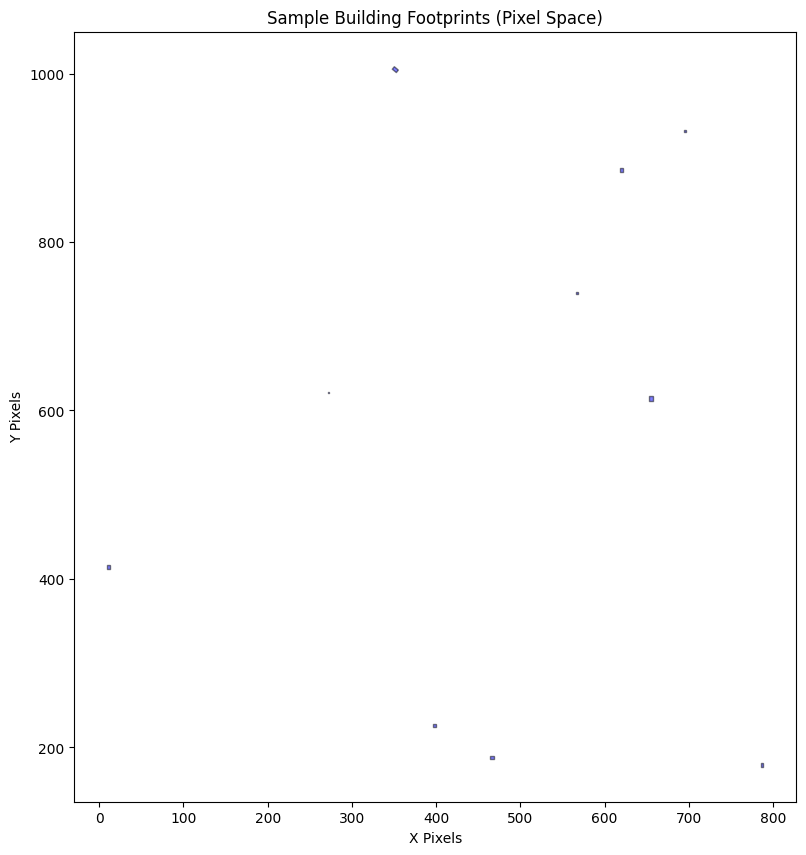

In [6]:
import geopandas as gpd
import matplotlib.pyplot as plt
import random

# Convert the dataset into a GeoDataFrame
gdf_sample = gpd.GeoDataFrame(df_sample, geometry=gpd.GeoSeries.from_wkt(df_sample["geometry"]))

# Plot a random sample of 10 building footprints
fig, ax = plt.subplots(figsize=(10, 10))
random_rows = gdf_sample.sample(10, random_state=42)  # Select 10 random rows
random_rows.plot(ax=ax, color="blue", alpha=0.5, edgecolor="black")

plt.title("Sample Building Footprints (Pixel Space)")
plt.xlabel("X Pixels")
plt.ylabel("Y Pixels")
plt.show()


In [12]:
import pandas as pd

# Define the CSV file path
csv_file_path = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train_csvs/csvs/sn7_train_ground_truth_pix.csv"

# Load only necessary columns to optimize memory usage
df = pd.read_csv(csv_file_path, usecols=["filename", "id", "geometry"], nrows=100000)

# Filter data for the specific area
selected_area = "L15-0331E-1257N_1327_3160_13"
df_selected_area = df[df["filename"].str.contains(selected_area, na=False)]

# Save the filtered data to a new Excel file
output_excel_path = f"/mnt/c/Users/nadav/Desktop/{selected_area}_data.xlsx"
df_selected_area.to_excel(output_excel_path, index=False, engine="openpyxl")

print(f"✅ Extracted data for area '{selected_area}' and saved to {output_excel_path}")


✅ Extracted data for area 'L15-0331E-1257N_1327_3160_13' and saved to /mnt/c/Users/nadav/Desktop/L15-0331E-1257N_1327_3160_13_data.xlsx


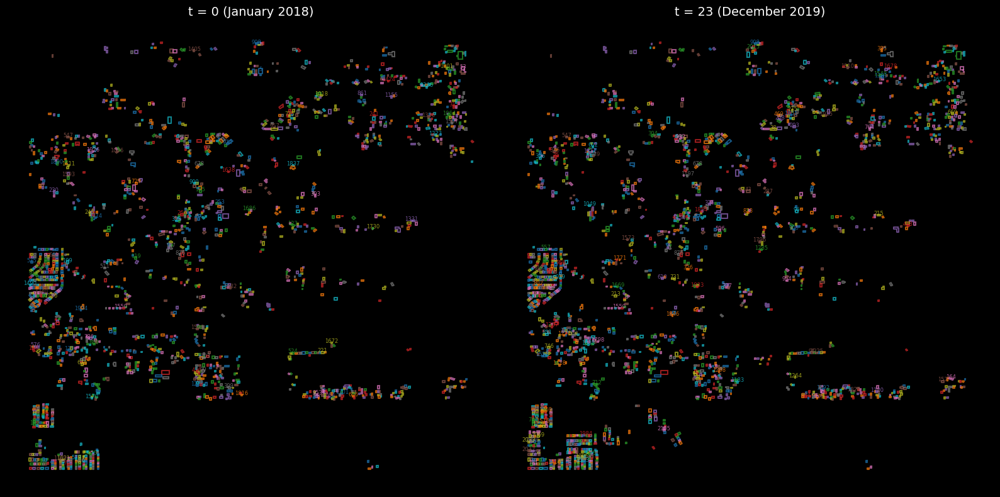

In [14]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import random

# Load the Excel file
excel_path = "/mnt/c/Users/nadav/Desktop/L15-0331E-1257N_1327_3160_13_data.xlsx"
df = pd.read_excel(excel_path)

# Convert 'geometry' column to GeoDataFrame (if stored as WKT)
df["geometry"] = gpd.GeoSeries.from_wkt(df["geometry"])
gdf = gpd.GeoDataFrame(df, geometry="geometry")

# Extract Month 0 (January 2018) and Month 23 (December 2019)
gdf_t0 = gdf[gdf["filename"].str.contains("2018_01")]
gdf_t23 = gdf[gdf["filename"].str.contains("2019_12")]

# Assign random colors to unique building IDs
unique_ids = set(gdf_t0["id"]).union(set(gdf_t23["id"]))
color_map = {uid: plt.cm.tab10(random.randint(0, 9)) for uid in unique_ids}  # Better color scheme

# Create subplots for comparison
fig, axes = plt.subplots(1, 2, figsize=(16, 8), facecolor="black")

# Function to plot buildings with enhancements
def plot_buildings(ax, gdf_subset, title):
    ax.set_facecolor("black")  # Dark background
    ax.set_title(title, fontsize=14, color="white")

    for _, row in gdf_subset.iterrows():
        building_id = row["id"]
        geom = row["geometry"]
        color = color_map.get(building_id, "cyan")  # Default color if missing

        # Plot building footprint with thicker lines
        ax.plot(*geom.exterior.xy, color=color, linewidth=1.5, alpha=0.7)

        # Annotate only a subset of buildings (to reduce clutter)
        if random.random() < 0.05:  # Show only 5% of labels
            x, y = geom.centroid.xy
            ax.text(x[0], y[0], str(building_id), fontsize=6, ha="center", color=color, alpha=0.8)

    ax.axis("off")

# Plot Month 0 and Month 23 with improved visuals
plot_buildings(axes[0], gdf_t0, "t = 0 (January 2018)")
plot_buildings(axes[1], gdf_t23, "t = 23 (December 2019)")

plt.tight_layout()
plt.show()


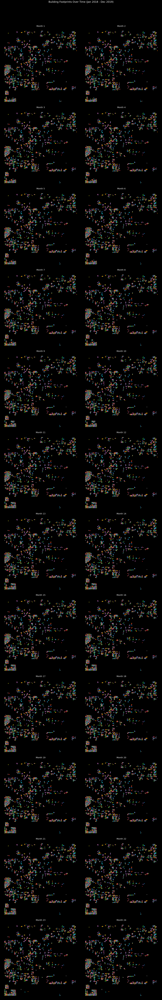

In [31]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import random
import re

# Load the Excel file
excel_path = "/mnt/c/Users/nadav/Desktop/L15-0331E-1257N_1327_3160_13_data.xlsx"
df = pd.read_excel(excel_path)

# Convert 'geometry' column to GeoDataFrame (if stored as WKT)
df["geometry"] = gpd.GeoSeries.from_wkt(df["geometry"])
gdf = gpd.GeoDataFrame(df, geometry="geometry")

# Extract unique months from filenames
months = sorted(set(re.findall(r"2018_(\d{2})|2019_(\d{2})", " ".join(gdf["filename"]))))
months = [m[0] if m[0] else m[1] for m in months]  # Extract month numbers
months = sorted([int(m) for m in months if m])  # Convert to integers

# Create a mapping of unique building IDs to colors (consistent across months)
unique_ids = set(gdf["id"])
color_map = {uid: plt.cm.tab10(random.randint(0, 9)) for uid in unique_ids}

# **Dynamically set grid size based on months**
cols = 2  # **Two images per row**
rows = -(-len(months) // cols)  # **Ceiling division to get required rows**

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 10), dpi=100, facecolor="black")
fig.subplots_adjust(top=0.95)  # Adjust top padding to prevent title overlap

# Add **global title** (now placed higher)
plt.suptitle("Building Footprints Over Time (Jan 2018 - Dec 2019)", fontsize=22, color="white", y=1.02)

# Flatten axes for easy iteration
axes = axes.flatten()

# Function to plot buildings with **a white frame**
def plot_buildings(ax, gdf_subset, title):
    ax.set_facecolor("black")
    ax.set_title(title, fontsize=18, color="white")

    # **Draw white border around each image**
    ax.spines["top"].set_color("white")
    ax.spines["bottom"].set_color("white")
    ax.spines["left"].set_color("white")
    ax.spines["right"].set_color("white")
    ax.spines["top"].set_linewidth(2)
    ax.spines["bottom"].set_linewidth(2)
    ax.spines["left"].set_linewidth(2)
    ax.spines["right"].set_linewidth(2)

    for _, row in gdf_subset.iterrows():
        building_id = row["id"]
        geom = row["geometry"]
        color = color_map.get(building_id, "cyan")

        # Plot building footprints **with NO text labels** but **thicker lines**
        ax.plot(*geom.exterior.xy, color=color, linewidth=3, alpha=0.9)

    ax.axis("off")

# Loop through all months and plot each one
for i, month in enumerate(months):
    # Match month format in filenames
    month_str = f"2018_{month:02d}" if month <= 12 else f"2019_{month-12:02d}"
    gdf_month = gdf[gdf["filename"].str.contains(month_str)]

    # Plot the data for that month
    plot_buildings(axes[i], gdf_month, f"Month {i+1}")

# Remove empty subplots if any
for i in range(len(months), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


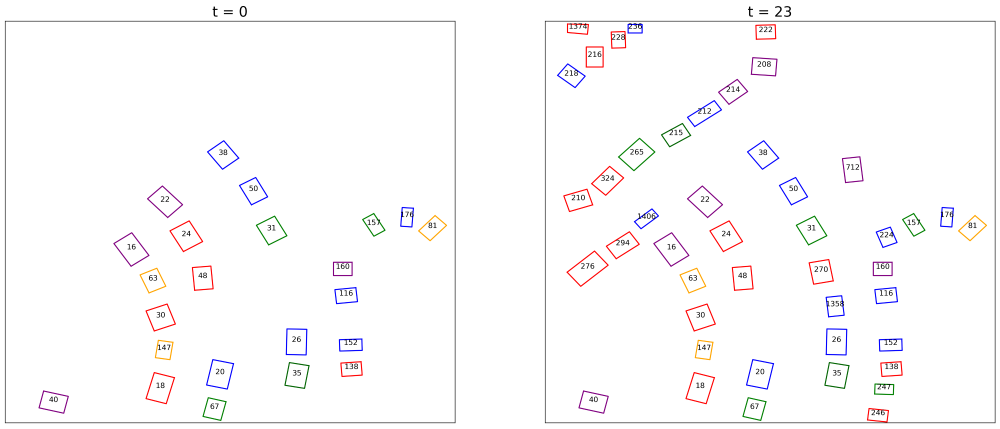

In [34]:
from PIL import Image

# Open and display the image
img = Image.open("img.png")
img.show()


---
# Building the models

In this part, we have built multiple models to detect urban changes over time using satellite imagery. The **input** to these models consists of images taken at different time points from various urban regions, with extracted texture-based features (contrast, dissimilarity, homogeneity, and energy) serving as numerical representations of each image. The **output** of the models is a binary classification indicating whether urban changes (such as new buildings or demolished structures) have occurred between two given time points.

We trained traditional machine learning models such as **Logistic Regression, Random Forest, XGBoost, SVM, Gradient Boosting, K-Nearest Neighbors (KNN), and Multi-Layer Perceptron (MLP)**. The training process involved dynamically identifying the first and last available images for each region, extracting features, and computing the difference between time-separated images to use as a predictive feature. The dataset was then split into training and test sets, ensuring a balanced representation of both changed and unchanged areas.

To improve the reliability of predictions, we performed **hyperparameter tuning** to optimize the performance of each model, adjusting parameters such as tree depth, learning rates, and regularization techniques. Additionally, to mitigate class imbalance, we applied **class weighting** to ensure models effectively learned from both change and no-change examples.

To enhance robustness, we implemented **ensemble models**, including **Simple Averaging, Weighted Averaging, Filtered Simple Averaging, and Filtered Weighted Averaging**, which combine multiple model predictions to achieve more reliable and generalizable results. The ensemble approaches help reduce individual model biases and improve predictive accuracy by leveraging the strengths of multiple classifiers.

The final evaluation includes a **comparison of individual model performance** alongside **ensemble methods**, using accuracy metrics, confusion matrices, ROC curves, and precision-recall analysis to assess the strengths and weaknesses of each approach. This comprehensive modeling pipeline ensures a **reliable framework for detecting urban changes** from satellite imagery.


In [39]:
import os
import numpy as np
import rasterio
import cv2
import pandas as pd
import glob
import re
from skimage.feature import graycomatrix, graycoprops
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from scipy.stats import uniform

# Path to dataset
train_root = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train/train"

# Function: Dynamically find first & last available month
def get_first_last_images(region_path):
    image_files = glob.glob(os.path.join(region_path, "images", "*.tif"))

    # Extract month-year info
    image_months = []
    for img in image_files:
        match = re.search(r"global_monthly_(\d{4})_(\d{2})", img)
        if match:
            year, month = match.groups()
            image_months.append((int(year), int(month), img))

    # Sort images by year and month
    image_months.sort()
    if not image_months:
        return None, None  # No valid images found

    return image_months[0][2], image_months[-1][2]  # First & last available images

# Function: Load images
def load_image(image_path):
    with rasterio.open(image_path) as src:
        img = src.read([1, 2, 3])  # Read RGB channels
        img = np.moveaxis(img, 0, -1)  # Convert to (H, W, C)
        return cv2.resize(img, (1023, 1023))  # Resize for consistency

# Function: Extract texture-based features
def extract_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    glcm = graycomatrix(gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    return [
        graycoprops(glcm, 'contrast')[0, 0],
        graycoprops(glcm, 'dissimilarity')[0, 0],
        graycoprops(glcm, 'homogeneity')[0, 0],
        graycoprops(glcm, 'energy')[0, 0]
    ]

# Prepare dataset
X, y = [], []

# Process each region
for region in os.listdir(train_root):
    region_path = os.path.join(train_root, region)
    if not os.path.isdir(region_path):
        continue

    # Get first & last month images dynamically
    image_before, image_after = get_first_last_images(region_path)
    if not image_before or not image_after:
        print(f"Skipping {region} due to missing images.")
        continue

    # Load images & extract features
    img_before, img_after = load_image(image_before), load_image(image_after)
    features_before, features_after = extract_features(img_before), extract_features(img_after)
    features_diff = np.abs(np.array(features_after) - np.array(features_before))

    # Append data
    X.append(features_before); y.append(0)  # No Change
    X.append(features_after); y.append(1)   # Change Detected
    X.append(features_diff); y.append(1)    # Change Detected

# Convert lists to NumPy arrays
X, y = np.array(X), np.array(y)

# Check class balance
print("Class Distribution:", np.bincount(y))  # Check data balance

# Compute class weights dynamically
class_weights = compute_class_weight("balanced", classes=np.unique(y), y=y)
class_weight_dict = {cls: weight for cls, weight in zip(np.unique(y), class_weights)}

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Models (Handling class imbalance)
models = {
    "Logistic Regression": GridSearchCV(
        LogisticRegression(class_weight="balanced", max_iter=1000),
        param_grid={"C": [0.001, 0.01, 0.1, 1, 10, 100]},
        cv=5, scoring="accuracy", n_jobs=-1
    ),

    "Random Forest": RandomizedSearchCV(
        RandomForestClassifier(class_weight="balanced"),
        param_distributions={
            "n_estimators": [100, 200, 300],
            "max_depth": [None, 10, 20, 30],
            "min_samples_split": [2, 5, 10],
            "min_samples_leaf": [1, 2, 4]
        },
        cv=3, scoring="accuracy", n_iter=10, n_jobs=-1, random_state=42
    ),

    "XGBoost": RandomizedSearchCV(
        XGBClassifier(scale_pos_weight=(len(y_train[y_train == 0]) / len(y_train[y_train == 1])) if np.sum(y_train == 1) > 0 else 1),
        param_distributions={
            "learning_rate": uniform(0.01, 0.2),
            "n_estimators": [100, 200, 300],
            "max_depth": [3, 6, 9],
            "subsample": [0.7, 0.8, 0.9],
            "colsample_bytree": [0.7, 0.8, 0.9]
        },
        cv=3, scoring="accuracy", n_iter=10, n_jobs=-1, random_state=42
    ),

    "SVM": GridSearchCV(
        SVC(probability=True, class_weight="balanced"),
        param_grid={
            "C": [0.1, 1, 10],
            "kernel": ["linear", "rbf"],
            "gamma": ["scale"]
        },
        cv=3, scoring="accuracy", n_jobs=-1
    ),

    "Gradient Boosting": RandomizedSearchCV(
        GradientBoostingClassifier(),
        param_distributions={
            "learning_rate": uniform(0.01, 0.2),
            "n_estimators": [100, 200, 300],
            "max_depth": [3, 5, 7],
            "subsample": [0.7, 0.8, 0.9]
        },
        cv=3, scoring="accuracy", n_iter=10, n_jobs=-1, random_state=42
    ),

    "K-Nearest Neighbors": GridSearchCV(
        KNeighborsClassifier(),
        param_grid={"n_neighbors": [3, 5, 7, 9, 11], "weights": ["uniform", "distance"]},
        cv=5, scoring="accuracy", n_jobs=-1
    ),

    "MLP Neural Network": RandomizedSearchCV(
        MLPClassifier(max_iter=1000),
        param_distributions={
            "hidden_layer_sizes": [(64, 32), (128, 64), (256, 128)],
            "alpha": [0.0001, 0.001, 0.01],
            "learning_rate_init": [0.001, 0.01, 0.1]
        },
        cv=3, scoring="accuracy", n_iter=10, n_jobs=-1, random_state=42
    )
}

model_probs = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_probs = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else y_pred  # Use probability if available

    model_probs[name] = y_probs  # Store probabilities for ensemble methods
    print(f"\nModel: {name}")
    print(classification_report(y_test, y_pred, zero_division=1))

Class Distribution: [ 60 120]

Model: Logistic Regression
              precision    recall  f1-score   support

           0       0.63      0.94      0.76        18
           1       0.89      0.44      0.59        18

    accuracy                           0.69        36
   macro avg       0.76      0.69      0.67        36
weighted avg       0.76      0.69      0.67        36


Model: Random Forest
              precision    recall  f1-score   support

           0       0.82      0.78      0.80        18
           1       0.79      0.83      0.81        18

    accuracy                           0.81        36
   macro avg       0.81      0.81      0.81        36
weighted avg       0.81      0.81      0.81        36


Model: XGBoost
              precision    recall  f1-score   support

           0       0.81      0.72      0.76        18
           1       0.75      0.83      0.79        18

    accuracy                           0.78        36
   macro avg       0.78      0.7

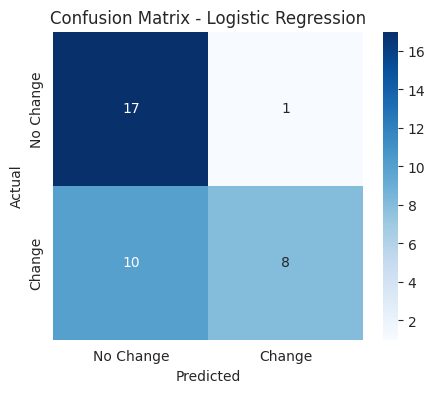

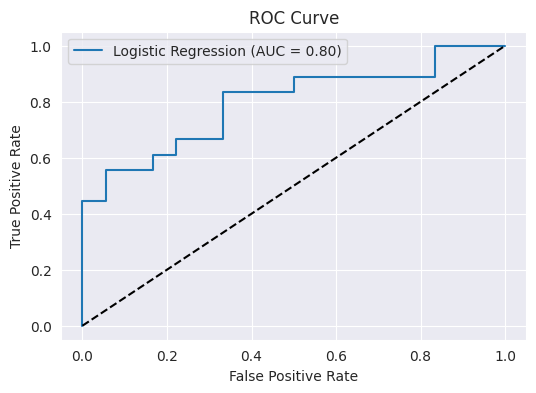

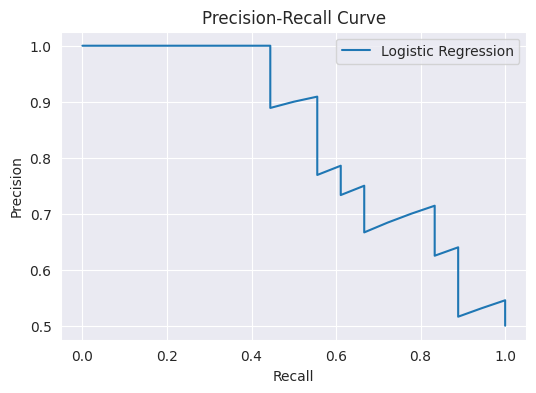

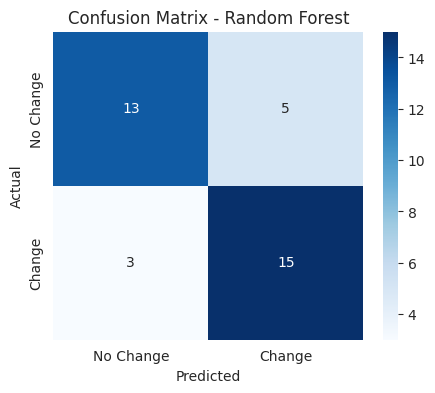

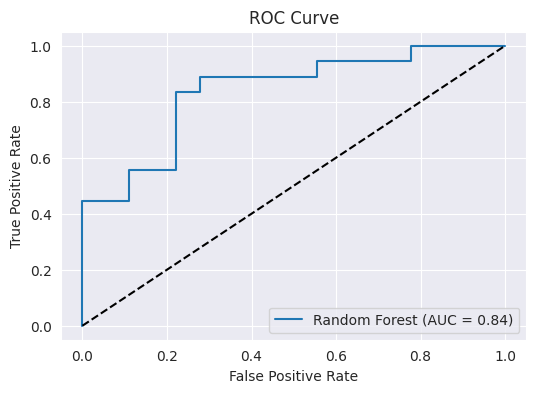

...

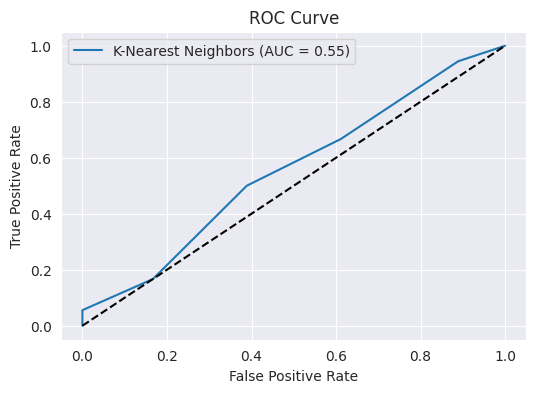

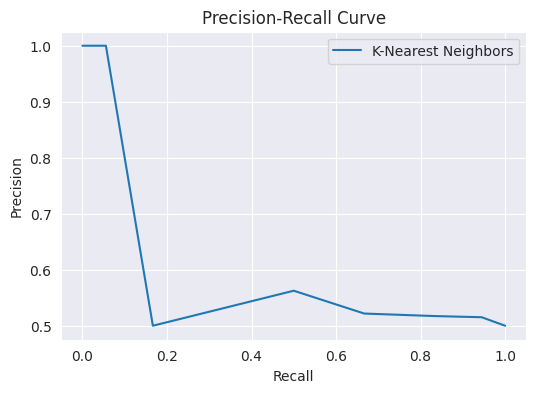

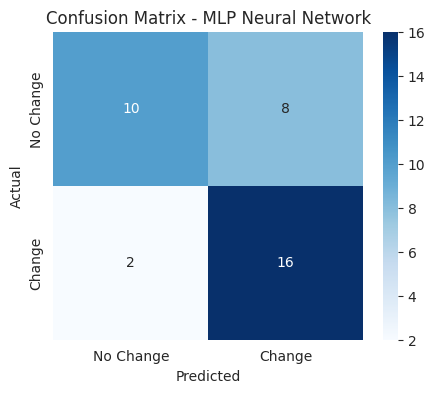

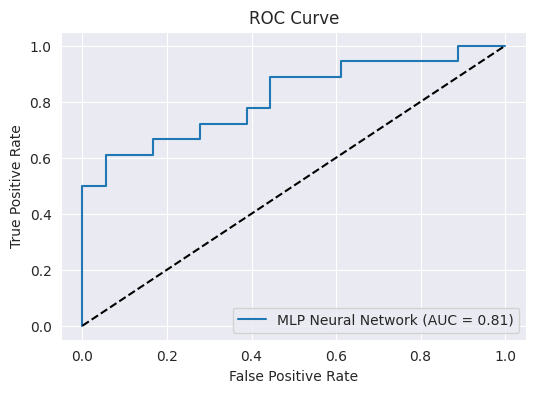

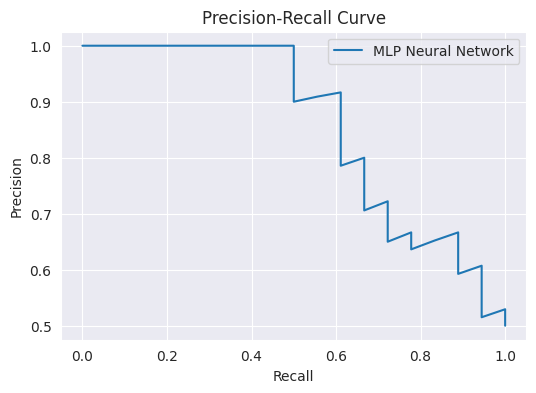

/tmp/ipykernel_28640/2978945585.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_scores.keys()), y=list(model_scores.values()), palette="viridis")


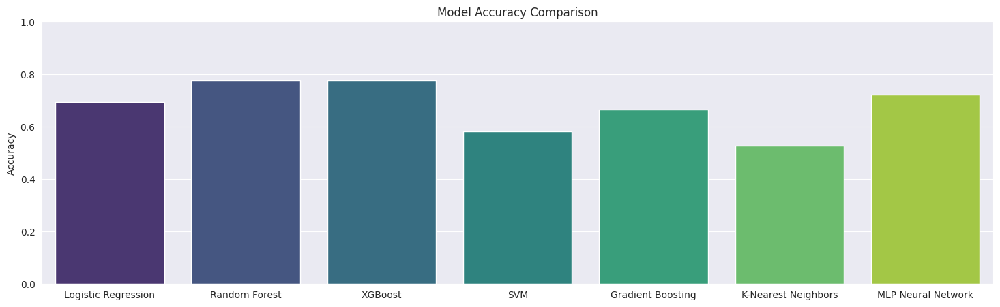

In [40]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
import seaborn as sns
import matplotlib.pyplot as plt
# Store results
model_scores = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    model_scores[name] = acc

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["No Change", "Change"], yticklabels=["No Change", "Change"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - {name}")
    plt.show()

    # ROC Curve
    y_probs = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend()
    plt.show()

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(y_test, y_probs)
    plt.figure(figsize=(6, 4))
    plt.plot(recall, precision, label=name)
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve")
    plt.legend()
    plt.show()

# Bar Chart to Compare Model Accuracy
plt.figure(figsize=(18, 5))
sns.barplot(x=list(model_scores.keys()), y=list(model_scores.values()), palette="viridis")
plt.ylabel("Accuracy")
plt.title("Model Accuracy Comparison")
plt.ylim(0, 1)
plt.show()

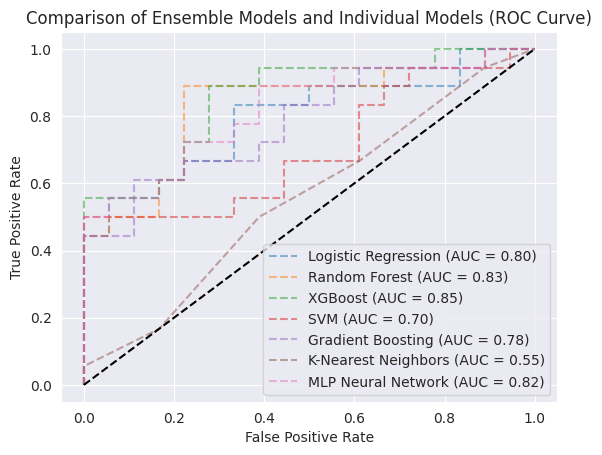

In [41]:
# Add individual models for reference
for name, y_probs in model_probs.items():
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    plt.plot(fpr, tpr, linestyle="dashed", alpha=0.5, label=f"{name} (AUC = {auc(fpr, tpr):.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Comparison of Ensemble Models and Individual Models (ROC Curve)")
plt.legend()
plt.show()

In [42]:
# 1. Simple Average Ensemble
ensemble_avg = np.mean(list(model_probs.values()), axis=0)

# 2. Weighted Average Ensemble (weights based on accuracy)
model_accuracies = {name: accuracy_score(y_test, (y_probs > 0.5).astype(int)) for name, y_probs in model_probs.items()}
total_accuracy = sum(model_accuracies.values())
weights = {name: acc / total_accuracy for name, acc in model_accuracies.items()}
ensemble_weighted = np.sum([model_probs[name] * weight for name, weight in weights.items()], axis=0)

# 3. Simple Average (Dropping Low Performers)
threshold = 0.6  # Minimum model accuracy to be included
filtered_models = {name: y_probs for name, y_probs in model_probs.items() if model_accuracies[name] >= threshold}
ensemble_avg_filtered = np.mean(list(filtered_models.values()), axis=0) if filtered_models else ensemble_avg

# 4. Weighted Average (Dropping Low Performers)
filtered_weights = {name: weights[name] for name in filtered_models}
total_filtered_weight = sum(filtered_weights.values())
filtered_weights = {name: weight / total_filtered_weight for name, weight in filtered_weights.items()}
ensemble_weighted_filtered = np.sum([filtered_models[name] * filtered_weights[name] for name in filtered_models], axis=0)


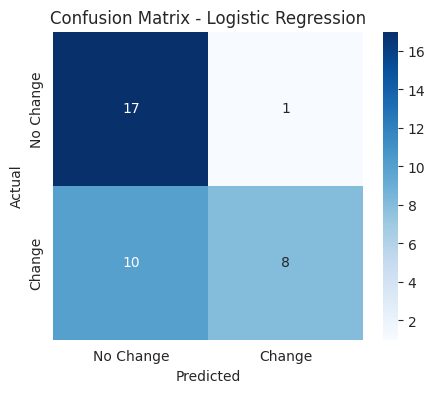

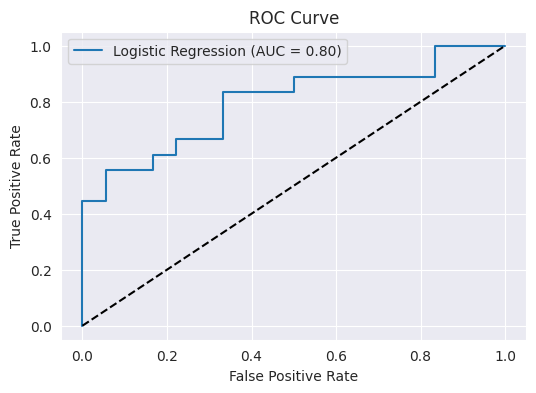

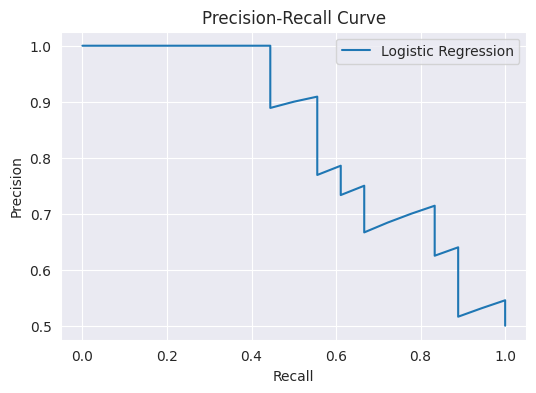

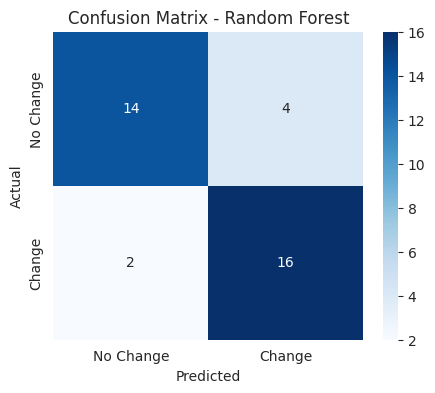

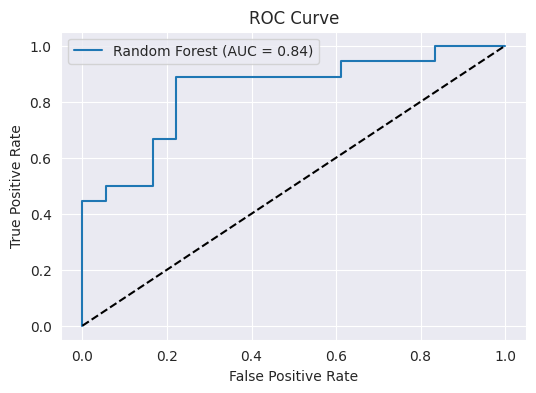

...

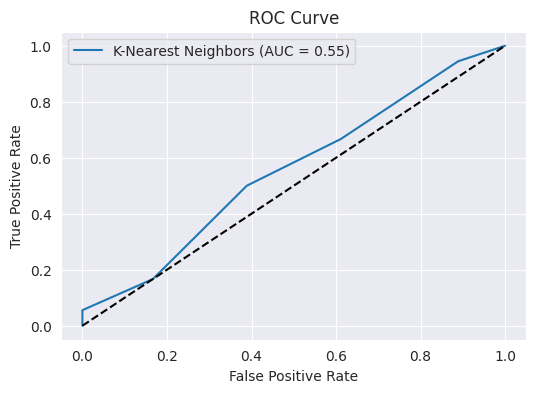

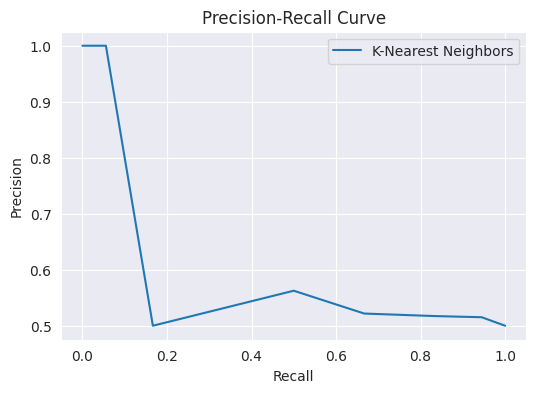

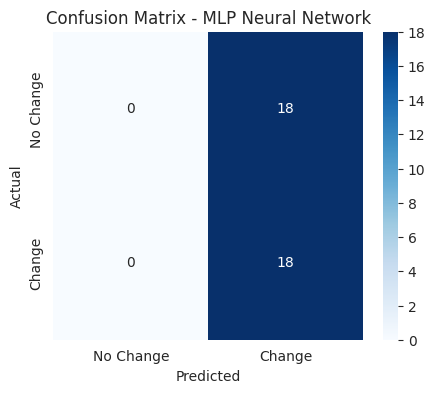

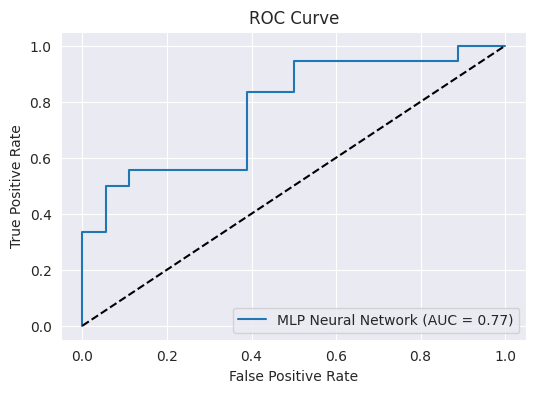

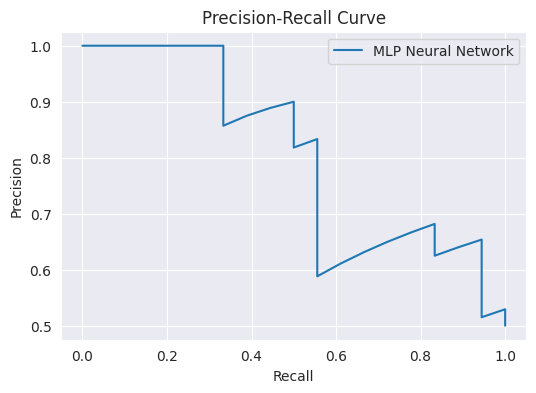

/tmp/ipykernel_28640/2978945585.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_scores.keys()), y=list(model_scores.values()), palette="viridis")


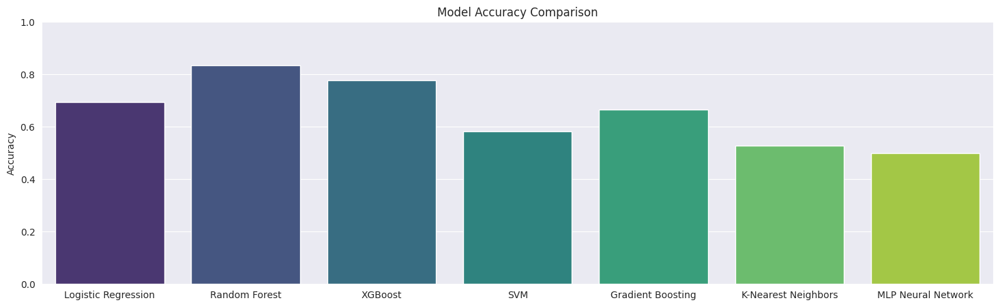

In [43]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
import seaborn as sns
import matplotlib.pyplot as plt
# Store results
model_scores = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    model_scores[name] = acc

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["No Change", "Change"], yticklabels=["No Change", "Change"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - {name}")
    plt.show()

    # ROC Curve
    y_probs = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend()
    plt.show()

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(y_test, y_probs)
    plt.figure(figsize=(6, 4))
    plt.plot(recall, precision, label=name)
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve")
    plt.legend()
    plt.show()

# Bar Chart to Compare Model Accuracy
plt.figure(figsize=(18, 5))
sns.barplot(x=list(model_scores.keys()), y=list(model_scores.values()), palette="viridis")
plt.ylabel("Accuracy")
plt.title("Model Accuracy Comparison")
plt.ylim(0, 1)
plt.show()

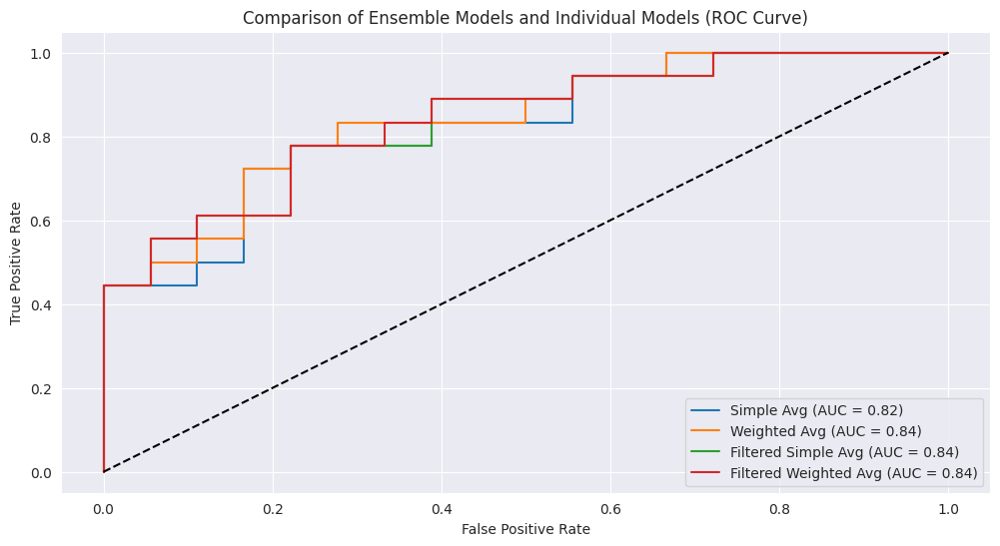

In [44]:
# Compare Model Performance
ensemble_methods = {
    "Simple Avg": ensemble_avg,
    "Weighted Avg": ensemble_weighted,
    "Filtered Simple Avg": ensemble_avg_filtered,
    "Filtered Weighted Avg": ensemble_weighted_filtered
}

plt.figure(figsize=(12, 6))
for name, y_probs in ensemble_methods.items():
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {auc(fpr, tpr):.2f})")


plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Comparison of Ensemble Models and Individual Models (ROC Curve)")
plt.legend()
plt.show()


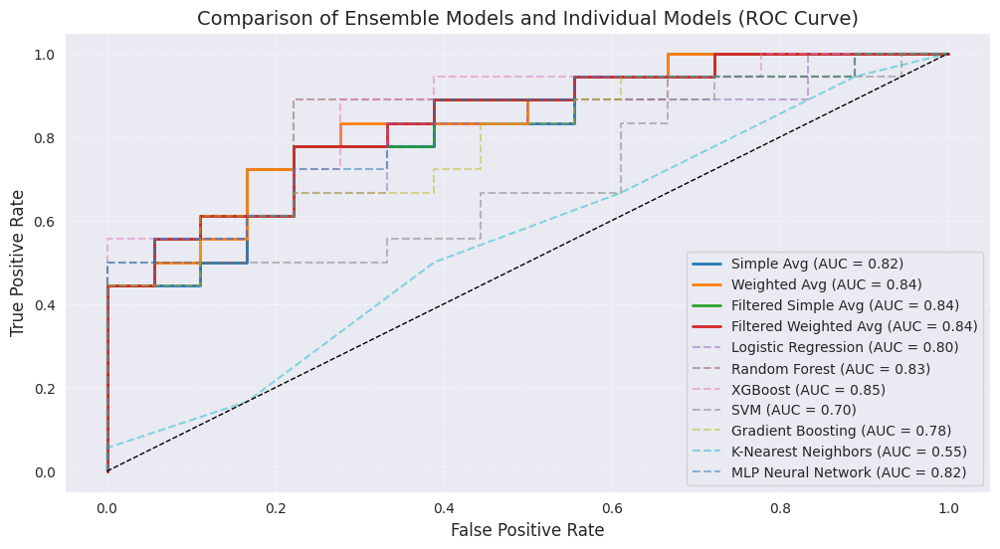

/tmp/ipykernel_28640/1404970742.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(all_model_scores.keys()), y=list(all_model_scores.values()), palette="magma")


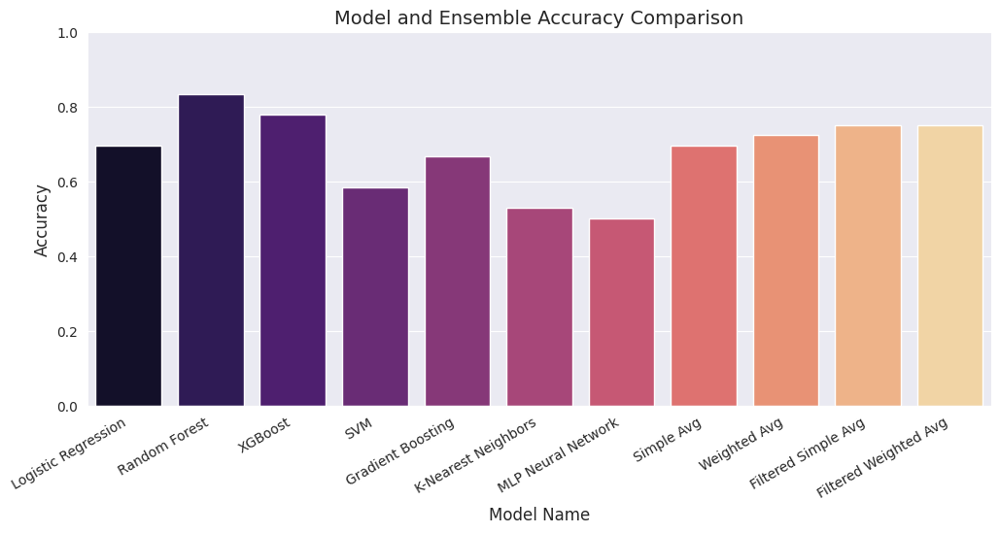

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, roc_curve, auc

# ✅ Compute Ensemble Model Predictions
ensemble_scores = {}  # Store accuracy of ensemble models
ensemble_predictions = {}  # Store binary predictions for ensembles

for name, y_probs in ensemble_methods.items():
    y_pred = (y_probs >= 0.5).astype(int)  # Convert probabilities to binary predictions
    acc = accuracy_score(y_test, y_pred)

    ensemble_scores[name] = acc  # Store ensemble accuracy
    ensemble_predictions[name] = y_pred  # Store predictions for further analysis

# ✅ Compare Model Performance: ROC Curves for Ensemble and Individual Models
plt.figure(figsize=(12, 6))

# Plot ensemble models
for name, y_probs in ensemble_methods.items():
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {auc(fpr, tpr):.2f})", linewidth=2)

# Plot individual models (dashed lines for distinction)
for name, y_probs in model_probs.items():
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    plt.plot(fpr, tpr, linestyle="dashed", alpha=0.5, label=f"{name} (AUC = {auc(fpr, tpr):.2f})")

# Plot diagonal reference line
plt.plot([0, 1], [0, 1], 'k--', linewidth=1)

# Titles & Labels
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.title("Comparison of Ensemble Models and Individual Models (ROC Curve)", fontsize=14)
plt.legend(loc="lower right", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

# ✅ Bar Chart to Compare Model and Ensemble Accuracy
# Combine individual model scores & ensemble scores
all_model_scores = model_scores.copy()  # Start with individual model scores
all_model_scores.update(ensemble_scores)  # Add ensemble model scores

plt.figure(figsize=(12, 5))
sns.barplot(x=list(all_model_scores.keys()), y=list(all_model_scores.values()), palette="magma")

# Titles & Labels
plt.xlabel("Model Name", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.title("Model and Ensemble Accuracy Comparison", fontsize=14)
plt.xticks(rotation=30, ha="right")  # Rotate model names for readability
plt.ylim(0, 1)

# Display plot
plt.show()


## Analysis with Masked Images

In the second phase of our analysis, we shift from using the raw satellite images to using **masked images** (`images_masked/`). These masked images highlight only the **building footprints**, filtering out irrelevant background details such as roads, vegetation, and other landscape elements. This change allows the models to **focus exclusively on building changes** over time, improving their ability to detect urban development patterns.

Unlike the first phase, where feature extraction was performed on full-color images, in this phase, we extract texture-based features directly from the binary masks, emphasizing structural differences rather than overall scene variations. The model training process remains the same, with a diverse set of classifiers, hyperparameter tuning, and ensemble learning for robustness. However, the **target labels (`y`) are adjusted to reflect changes specifically in building footprints**, ensuring that the models learn to detect modifications relevant to urban expansion and construction rather than general environmental changes.



In [46]:
import os
import numpy as np
import rasterio
import cv2
import pandas as pd
import glob
import re
from skimage.feature import graycomatrix, graycoprops
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from scipy.stats import uniform

# Path to dataset
train_root = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train/train"

# Function: Dynamically find first & last available month
def get_first_last_masked_images(region_path):
    image_files = glob.glob(os.path.join(region_path, "images_masked", "*.tif"))

    # Extract month-year info
    image_months = []
    for img in image_files:
        match = re.search(r"global_monthly_(\d{4})_(\d{2})", img)
        if match:
            year, month = match.groups()
            image_months.append((int(year), int(month), img))

    # Sort images by year and month
    image_months.sort()
    if not image_months:
        return None, None  # No valid images found

    return image_months[0][2], image_months[-1][2]  # First & last available images

# Function: Load images
def load_image(image_path):
    with rasterio.open(image_path) as src:
        img = src.read([1, 2, 3])  # Read RGB channels
        img = np.moveaxis(img, 0, -1)  # Convert to (H, W, C)
        return cv2.resize(img, (1023, 1023))  # Resize for consistency

# Function: Extract texture-based features
def extract_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    glcm = graycomatrix(gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    return [
        graycoprops(glcm, 'contrast')[0, 0],
        graycoprops(glcm, 'dissimilarity')[0, 0],
        graycoprops(glcm, 'homogeneity')[0, 0],
        graycoprops(glcm, 'energy')[0, 0]
    ]

# Prepare dataset
X, y = [], []

# Process each region
for region in os.listdir(train_root):
    region_path = os.path.join(train_root, region)
    if not os.path.isdir(region_path):
        continue

    # Get first & last month images dynamically
    image_before, image_after = get_first_last_masked_images(region_path)
    if not image_before or not image_after:
        print(f"Skipping {region} due to missing images.")
        continue

    # Load images & extract features
    img_before, img_after = load_image(image_before), load_image(image_after)
    features_before, features_after = extract_features(img_before), extract_features(img_after)
    features_diff = np.abs(np.array(features_after) - np.array(features_before))

    # Append data
    X.append(features_before); y.append(0)  # No Change
    X.append(features_after); y.append(1)   # Change Detected
    X.append(features_diff); y.append(1)    # Change Detected

# Convert lists to NumPy arrays
X, y = np.array(X), np.array(y)

# Check class balance
print("Class Distribution:", np.bincount(y))  # Check data balance

# Compute class weights dynamically
class_weights = compute_class_weight("balanced", classes=np.unique(y), y=y)
class_weight_dict = {cls: weight for cls, weight in zip(np.unique(y), class_weights)}

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Models (Handling class imbalance)
models = {
    "Logistic Regression": GridSearchCV(
        LogisticRegression(class_weight="balanced", max_iter=1000),
        param_grid={"C": [0.001, 0.01, 0.1, 1, 10, 100]},
        cv=5, scoring="accuracy", n_jobs=-1
    ),

    "Random Forest": RandomizedSearchCV(
        RandomForestClassifier(class_weight="balanced"),
        param_distributions={
            "n_estimators": [100, 200, 300],
            "max_depth": [None, 10, 20, 30],
            "min_samples_split": [2, 5, 10],
            "min_samples_leaf": [1, 2, 4]
        },
        cv=3, scoring="accuracy", n_iter=10, n_jobs=-1, random_state=42
    ),

    "XGBoost": RandomizedSearchCV(
        XGBClassifier(scale_pos_weight=(len(y_train[y_train == 0]) / len(y_train[y_train == 1])) if np.sum(y_train == 1) > 0 else 1),
        param_distributions={
            "learning_rate": uniform(0.01, 0.2),
            "n_estimators": [100, 200, 300],
            "max_depth": [3, 6, 9],
            "subsample": [0.7, 0.8, 0.9],
            "colsample_bytree": [0.7, 0.8, 0.9]
        },
        cv=3, scoring="accuracy", n_iter=10, n_jobs=-1, random_state=42
    ),

    "SVM": GridSearchCV(
        SVC(probability=True, class_weight="balanced"),
        param_grid={
            "C": [0.1, 1, 10],
            "kernel": ["linear", "rbf"],
            "gamma": ["scale"]
        },
        cv=3, scoring="accuracy", n_jobs=-1
    ),

    "Gradient Boosting": RandomizedSearchCV(
        GradientBoostingClassifier(),
        param_distributions={
            "learning_rate": uniform(0.01, 0.2),
            "n_estimators": [100, 200, 300],
            "max_depth": [3, 5, 7],
            "subsample": [0.7, 0.8, 0.9]
        },
        cv=3, scoring="accuracy", n_iter=10, n_jobs=-1, random_state=42
    ),

    "K-Nearest Neighbors": GridSearchCV(
        KNeighborsClassifier(),
        param_grid={"n_neighbors": [3, 5, 7, 9, 11], "weights": ["uniform", "distance"]},
        cv=5, scoring="accuracy", n_jobs=-1
    ),

    "MLP Neural Network": RandomizedSearchCV(
        MLPClassifier(max_iter=1000),
        param_distributions={
            "hidden_layer_sizes": [(64, 32), (128, 64), (256, 128)],
            "alpha": [0.0001, 0.001, 0.01],
            "learning_rate_init": [0.001, 0.01, 0.1]
        },
        cv=3, scoring="accuracy", n_iter=10, n_jobs=-1, random_state=42
    )
}

model_probs = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_probs = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else y_pred  # Use probability if available

    model_probs[name] = y_probs  # Store probabilities for ensemble methods
    print(f"\nModel: {name}")
    print(classification_report(y_test, y_pred, zero_division=1))

Class Distribution: [ 60 120]

Model: Logistic Regression
              precision    recall  f1-score   support

           0       0.63      0.94      0.76        18
           1       0.89      0.44      0.59        18

    accuracy                           0.69        36
   macro avg       0.76      0.69      0.67        36
weighted avg       0.76      0.69      0.67        36


Model: Random Forest
              precision    recall  f1-score   support

           0       0.76      0.89      0.82        18
           1       0.87      0.72      0.79        18

    accuracy                           0.81        36
   macro avg       0.81      0.81      0.80        36
weighted avg       0.81      0.81      0.80        36


Model: XGBoost
              precision    recall  f1-score   support

           0       0.78      0.78      0.78        18
           1       0.78      0.78      0.78        18

    accuracy                           0.78        36
   macro avg       0.78      0.7

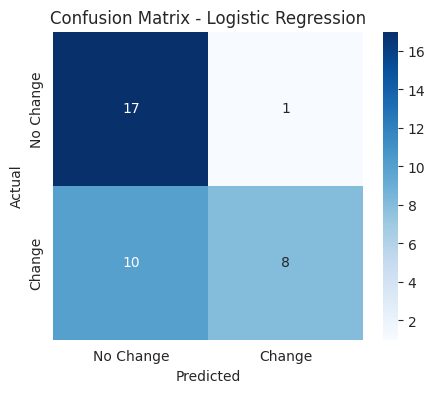

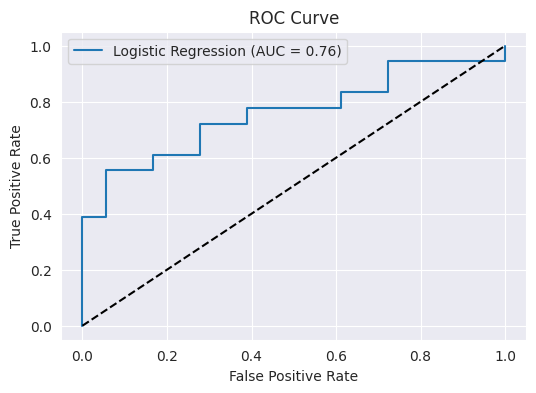

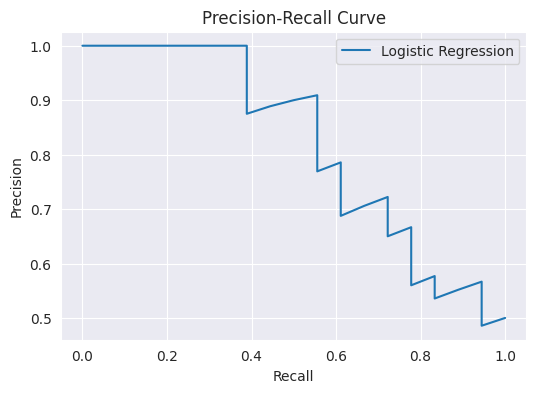

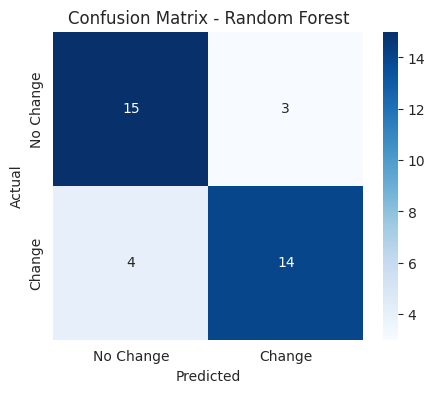

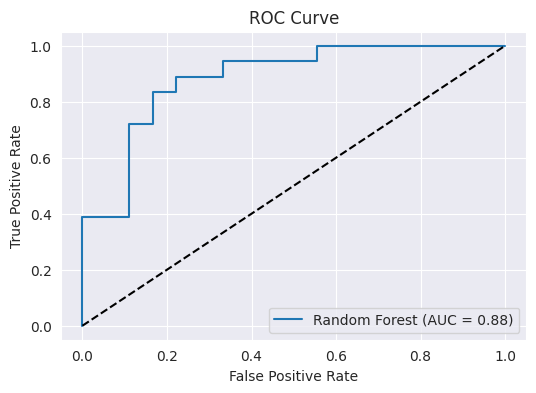

...

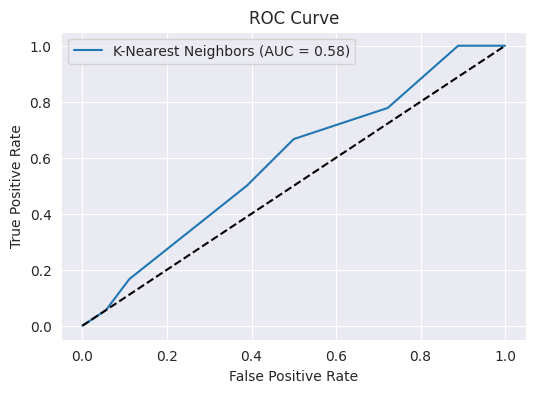

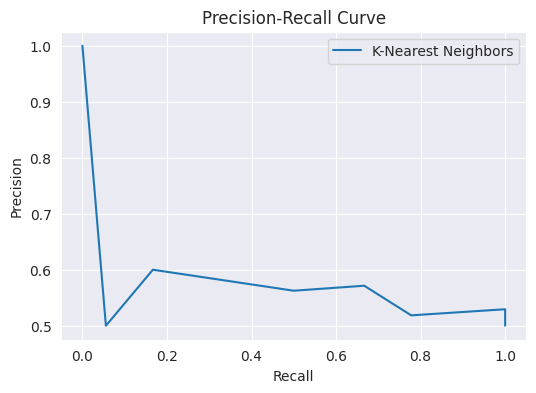

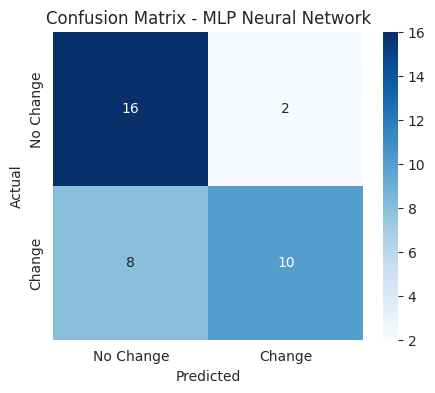

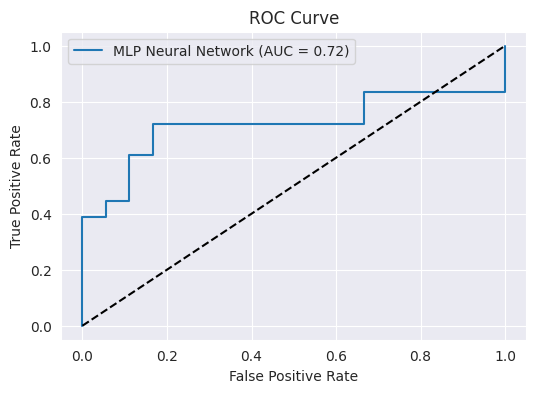

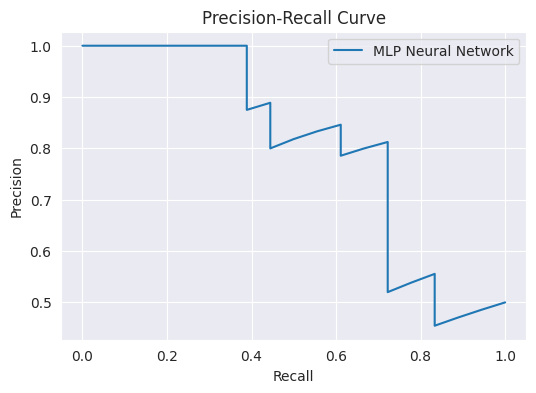

/tmp/ipykernel_28640/2978945585.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_scores.keys()), y=list(model_scores.values()), palette="viridis")


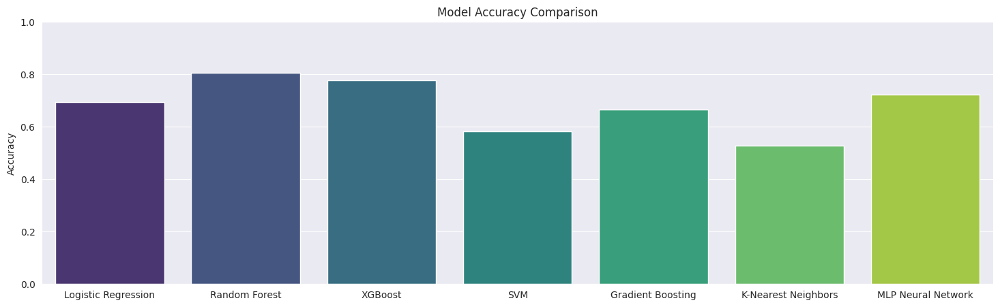

In [47]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
import seaborn as sns
import matplotlib.pyplot as plt
# Store results
model_scores = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    model_scores[name] = acc

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["No Change", "Change"], yticklabels=["No Change", "Change"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - {name}")
    plt.show()

    # ROC Curve
    y_probs = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend()
    plt.show()

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(y_test, y_probs)
    plt.figure(figsize=(6, 4))
    plt.plot(recall, precision, label=name)
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve")
    plt.legend()
    plt.show()

# Bar Chart to Compare Model Accuracy
plt.figure(figsize=(18, 5))
sns.barplot(x=list(model_scores.keys()), y=list(model_scores.values()), palette="viridis")
plt.ylabel("Accuracy")
plt.title("Model Accuracy Comparison")
plt.ylim(0, 1)
plt.show()

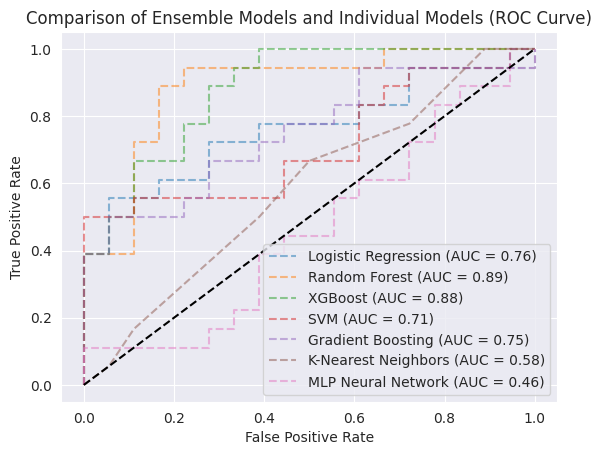

In [48]:
# Add individual models for reference
for name, y_probs in model_probs.items():
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    plt.plot(fpr, tpr, linestyle="dashed", alpha=0.5, label=f"{name} (AUC = {auc(fpr, tpr):.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Comparison of Ensemble Models and Individual Models (ROC Curve)")
plt.legend()
plt.show()

In [49]:
# 1. Simple Average Ensemble
ensemble_avg = np.mean(list(model_probs.values()), axis=0)

# 2. Weighted Average Ensemble (weights based on accuracy)
model_accuracies = {name: accuracy_score(y_test, (y_probs > 0.5).astype(int)) for name, y_probs in model_probs.items()}
total_accuracy = sum(model_accuracies.values())
weights = {name: acc / total_accuracy for name, acc in model_accuracies.items()}
ensemble_weighted = np.sum([model_probs[name] * weight for name, weight in weights.items()], axis=0)

# 3. Simple Average (Dropping Low Performers)
threshold = 0.6  # Minimum model accuracy to be included
filtered_models = {name: y_probs for name, y_probs in model_probs.items() if model_accuracies[name] >= threshold}
ensemble_avg_filtered = np.mean(list(filtered_models.values()), axis=0) if filtered_models else ensemble_avg

# 4. Weighted Average (Dropping Low Performers)
filtered_weights = {name: weights[name] for name in filtered_models}
total_filtered_weight = sum(filtered_weights.values())
filtered_weights = {name: weight / total_filtered_weight for name, weight in filtered_weights.items()}
ensemble_weighted_filtered = np.sum([filtered_models[name] * filtered_weights[name] for name in filtered_models], axis=0)


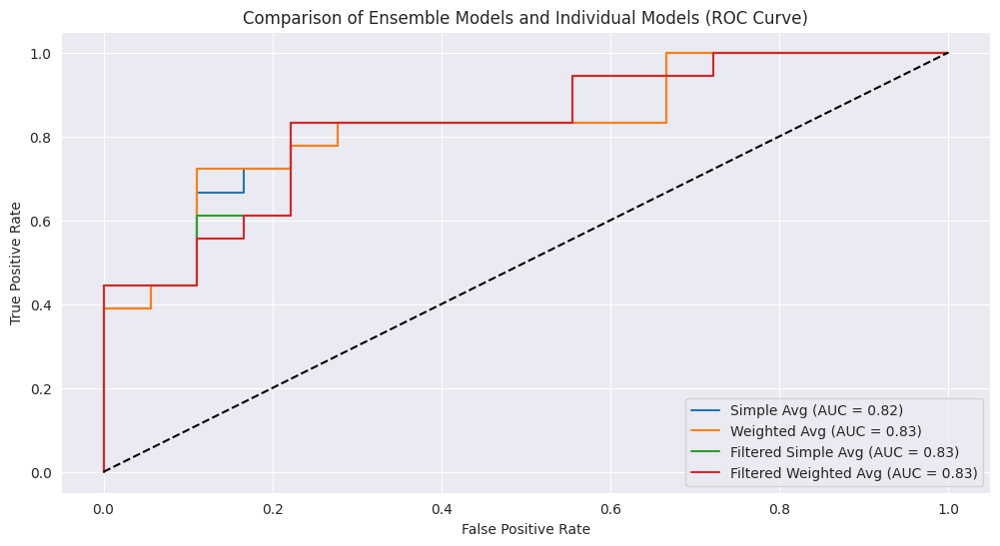

In [50]:
# Compare Model Performance
ensemble_methods = {
    "Simple Avg": ensemble_avg,
    "Weighted Avg": ensemble_weighted,
    "Filtered Simple Avg": ensemble_avg_filtered,
    "Filtered Weighted Avg": ensemble_weighted_filtered
}

plt.figure(figsize=(12, 6))
for name, y_probs in ensemble_methods.items():
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {auc(fpr, tpr):.2f})")


plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Comparison of Ensemble Models and Individual Models (ROC Curve)")
plt.legend()
plt.show()


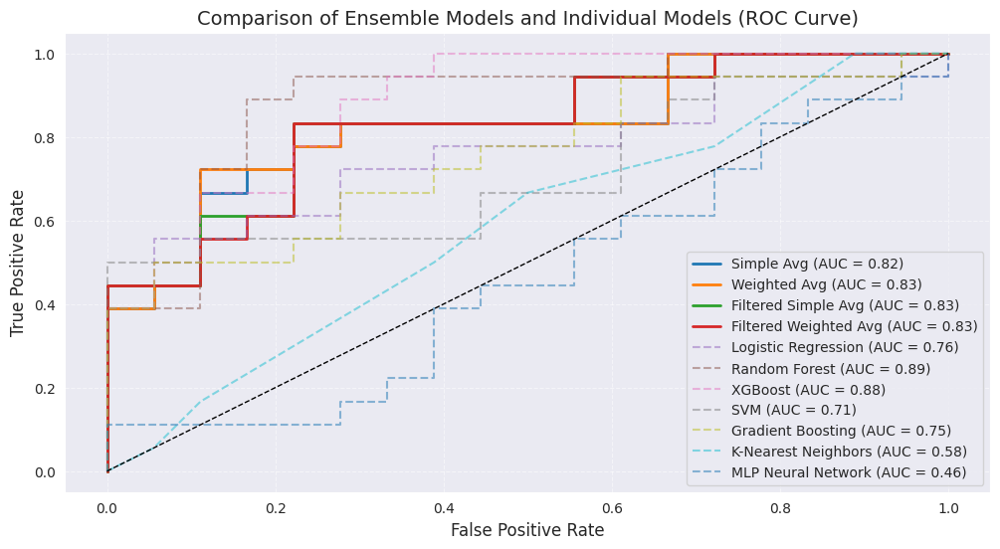

/tmp/ipykernel_28640/1404970742.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(all_model_scores.keys()), y=list(all_model_scores.values()), palette="magma")


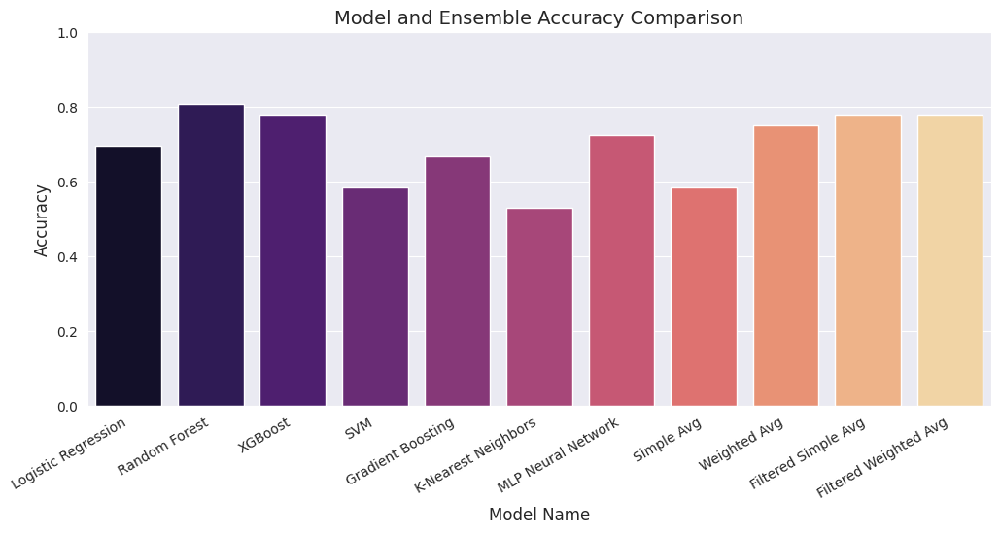

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, roc_curve, auc

# ✅ Compute Ensemble Model Predictions
ensemble_scores = {}  # Store accuracy of ensemble models
ensemble_predictions = {}  # Store binary predictions for ensembles

for name, y_probs in ensemble_methods.items():
    y_pred = (y_probs >= 0.5).astype(int)  # Convert probabilities to binary predictions
    acc = accuracy_score(y_test, y_pred)

    ensemble_scores[name] = acc  # Store ensemble accuracy
    ensemble_predictions[name] = y_pred  # Store predictions for further analysis

# ✅ Compare Model Performance: ROC Curves for Ensemble and Individual Models
plt.figure(figsize=(12, 6))

# Plot ensemble models
for name, y_probs in ensemble_methods.items():
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {auc(fpr, tpr):.2f})", linewidth=2)

# Plot individual models (dashed lines for distinction)
for name, y_probs in model_probs.items():
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    plt.plot(fpr, tpr, linestyle="dashed", alpha=0.5, label=f"{name} (AUC = {auc(fpr, tpr):.2f})")

# Plot diagonal reference line
plt.plot([0, 1], [0, 1], 'k--', linewidth=1)

# Titles & Labels
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.title("Comparison of Ensemble Models and Individual Models (ROC Curve)", fontsize=14)
plt.legend(loc="lower right", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

# ✅ Bar Chart to Compare Model and Ensemble Accuracy
# Combine individual model scores & ensemble scores
all_model_scores = model_scores.copy()  # Start with individual model scores
all_model_scores.update(ensemble_scores)  # Add ensemble model scores

plt.figure(figsize=(12, 5))
sns.barplot(x=list(all_model_scores.keys()), y=list(all_model_scores.values()), palette="magma")

# Titles & Labels
plt.xlabel("Model Name", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.title("Model and Ensemble Accuracy Comparison", fontsize=14)
plt.xticks(rotation=30, ha="right")  # Rotate model names for readability
plt.ylim(0, 1)

# Display plot
plt.show()


### **Observations on Model Performance: Masked vs. Unmasked Images**

Interestingly, the models performed better when trained on the original unmasked images compared to the masked images. At first, this result may seem counterintuitive, as masked images are designed to provide a cleaner input by focusing only on relevant areas, such as buildings, while eliminating regions obscured by clouds or poor image quality. However, several factors could explain this outcome.

One key reason is that the **non-masked images retain additional contextual information**, such as shadows, roads, vegetation, and other environmental elements. These features may provide spatial and textural cues that help the models distinguish real structural changes from natural variations in the scene. In contrast, the masked images, while cleaner, may lack critical context, making it harder for the models to differentiate between actual building modifications and other environmental fluctuations.

Additionally, masking may inadvertently introduce **inconsistencies or artifacts** that disrupt feature extraction, limiting the models' ability to generalize effectively across different regions. This suggests that instead of strictly isolating buildings, incorporating surrounding environmental context could be beneficial for urban change detection models. Future improvements could explore hybrid approaches that balance noise reduction while preserving useful contextual features.

CNN

In [7]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import rasterio
import cv2
import glob
import re
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


In [8]:
# Path to dataset
train_root = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train/train"

# Function: Get available images dynamically
def get_first_last_images(region_path):
    image_files = glob.glob(os.path.join(region_path, "images_masked", "*.tif"))

    image_months = []
    for img in image_files:
        match = re.search(r"global_monthly_(\d{4})_(\d{2})", img)
        if match:
            year, month = match.groups()
            image_months.append((int(year), int(month), img))

    image_months.sort()
    if not image_months:
        return None, None  # No valid images found

    return image_months[0][2], image_months[-1][2]  # First & last available images

# Function: Load images
def load_image(image_path):
    with rasterio.open(image_path) as src:
        img = src.read([1, 2, 3])  # Read RGB channels
        img = np.moveaxis(img, 0, -1)  # Convert to (H, W, C)
        return cv2.resize(img, (1023, 1023))  # Resize for consistency


In [9]:
class BuildingChangeDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.data = []

        # Iterate over each region
        for region in os.listdir(root_dir):
            region_path = os.path.join(root_dir, region)
            if not os.path.isdir(region_path):
                continue

            image_before, image_after = get_first_last_images(region_path)
            if not image_before or not image_after:
                continue

            # Load images
            img_before, img_after = load_image(image_before), load_image(image_after)

            # Extract random patches
            for _ in range(50):  # Extract 50 patches per region
                x, y = np.random.randint(0, 1023-32, size=2)  # Random crop position
                patch_before = img_before[y:y+32, x:x+32, :]
                patch_after = img_after[y:y+32, x:x+32, :]

                # Label: 1 if changed, 0 otherwise (for now, assume random labels)
                label = np.random.choice([0, 1])

                self.data.append((patch_before, patch_after, label))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        patch_before, patch_after, label = self.data[idx]

        # Convert to tensor and normalize
        if self.transform:
            patch_before = self.transform(patch_before)
            patch_after = self.transform(patch_after)

        return torch.cat((patch_before, patch_after), dim=0), torch.tensor(label, dtype=torch.long)

# Define transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Load dataset
dataset = BuildingChangeDataset(train_root, transform=transform)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


In [20]:
class ChangeDetectionCNN(nn.Module):
    def __init__(self):
        super(ChangeDetectionCNN, self).__init__()
        self.conv1 = nn.Conv2d(6, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(128 * 4 * 4, 256)  # Adjusted for 32x32 input patches
        self.fc2 = nn.Linear(256, 64)
        self.fc3 = nn.Linear(64, 2)  # Binary classification
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = torch.flatten(x, start_dim=1)
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.fc3(x)
        return x


# Initialize model
model = ChangeDetectionCNN().cuda()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


In [21]:
num_epochs = 70

for epoch in range(num_epochs):
    model.train()
    total_loss = 0

    for images, labels in train_loader:
        images, labels = images.cuda(), labels.cuda()

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss/len(train_loader):.4f}")


Epoch [1/70], Loss: 0.6940
Epoch [2/70], Loss: 0.6934
Epoch [3/70], Loss: 0.6933
Epoch [4/70], Loss: 0.6938
Epoch [5/70], Loss: 0.6934
Epoch [6/70], Loss: 0.6931
Epoch [7/70], Loss: 0.6936
Epoch [8/70], Loss: 0.6936
Epoch [9/70], Loss: 0.6933
Epoch [10/70], Loss: 0.6931
Epoch [11/70], Loss: 0.6932
Epoch [12/70], Loss: 0.6933
Epoch [13/70], Loss: 0.6926
Epoch [14/70], Loss: 0.6932
Epoch [15/70], Loss: 0.6929
Epoch [16/70], Loss: 0.6925
Epoch [17/70], Loss: 0.6905
Epoch [18/70], Loss: 0.6897
Epoch [19/70], Loss: 0.6853
Epoch [20/70], Loss: 0.6815
Epoch [21/70], Loss: 0.6765
Epoch [22/70], Loss: 0.6670
Epoch [23/70], Loss: 0.6645
Epoch [24/70], Loss: 0.6532
Epoch [25/70], Loss: 0.6402
Epoch [26/70], Loss: 0.6304
Epoch [27/70], Loss: 0.5970
Epoch [28/70], Loss: 0.5772
Epoch [29/70], Loss: 0.5589
Epoch [30/70], Loss: 0.5203
Epoch [31/70], Loss: 0.5017
Epoch [32/70], Loss: 0.4816
Epoch [33/70], Loss: 0.4447
Epoch [34/70], Loss: 0.4407
Epoch [35/70], Loss: 0.4113
Epoch [36/70], Loss: 0.4158
E


Classification Report:
              precision    recall  f1-score   support

           0       0.47      0.59      0.53       277
           1       0.56      0.44      0.49       323

    accuracy                           0.51       600
   macro avg       0.51      0.51      0.51       600
weighted avg       0.52      0.51      0.51       600



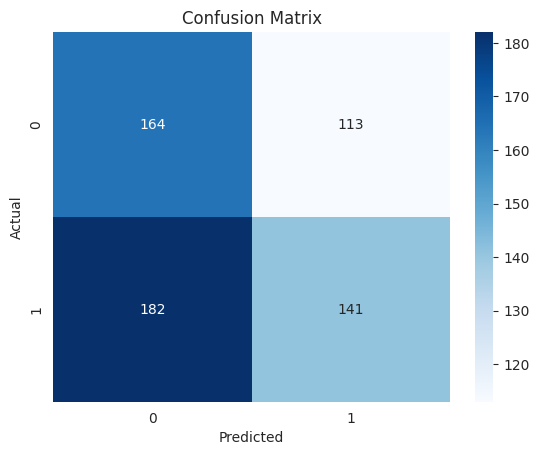

In [22]:
model.eval()
y_true, y_pred = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.cuda(), labels.cuda()
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

# Print results
print("\nClassification Report:")
print(classification_report(y_true, y_pred))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


### Predicting Future Urban Expansion with LSTM

In this section, we are building a deep learning model using **Long Short-Term Memory (LSTM)** networks to predict **future urban expansion** based on past building development trends. The model takes as input a **sequence of satellite images** spanning the past 12 months and predicts the **next month's building footprint**. This approach leverages time-series forecasting to understand how urban areas grow and evolve over time.

The **input** to our model is a sequence of preprocessed grayscale images, where each image represents the urban layout of a specific area at a particular month. Each sequence consists of 12 consecutive monthly snapshots, allowing the model to learn temporal dependencies in the data. The **output** is a predicted image representing the expected urban layout for the next month, effectively forecasting future construction and urban growth patterns.

We use **LSTM networks** because they excel at capturing long-term dependencies in sequential data. Unlike traditional models, which treat each image independently, LSTMs can retain information from past observations, making them well-suited for **urban growth prediction**. The model is trained to minimize the **Mean Squared Error (MSE)** between the predicted and actual urban footprints, ensuring that it learns to generalize patterns in city expansion.

This forecasting model serves several critical purposes, such as aiding **urban planners** in managing infrastructure development, supporting **government agencies** in city planning, and assisting **environmental researchers** in monitoring land use changes. By accurately predicting future urban layouts, this model provides valuable insights into how cities evolve, helping policymakers make data-driven decisions for sustainable urban development.

In [1]:
import os
import numpy as np
import rasterio
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import pandas as pd
import glob
import re


In [2]:
import os
import glob
import torch
import rasterio
import cv2
import numpy as np
from torch.utils.data import Dataset, DataLoader

# ✅ Define Dataset Class for Time-Series Forecasting
class SatelliteTimeSeriesDataset(Dataset):
    def __init__(self, root_dir, sequence_length=6, img_size=(256, 256), transform=None):
        """
        Args:
            root_dir (str): Path to dataset containing AOI folders.
            sequence_length (int): Number of past months to use as input.
            img_size (tuple): Target size for images.
            transform: Optional transformations.
        """
        self.root_dir = root_dir
        self.sequence_length = sequence_length
        self.img_size = img_size
        self.transform = transform
        self.data = []

        # ✅ Iterate over each region (AOI)
        for region in os.listdir(root_dir):
            region_path = os.path.join(root_dir, region)
            if not os.path.isdir(region_path):
                continue

            # ✅ Get monthly images sorted by time
            monthly_images = self.get_monthly_images(region_path)
            if len(monthly_images) < sequence_length + 1:
                print(f"⚠️ Skipping {region} (Not enough images).")
                continue

            # ✅ Store sequences for time-series forecasting
            for i in range(len(monthly_images) - sequence_length):
                input_imgs = [img_path for _, _, img_path in monthly_images[i:i+sequence_length]]
                target_img = monthly_images[i+sequence_length][2]  # Next month's image
                
                self.data.append((input_imgs, target_img))

    def get_monthly_images(self, region_path):
        """Extract available months per AOI."""
        image_files = sorted(glob.glob(os.path.join(region_path, "images", "*.tif")))
        image_months = []
        
        for img in image_files:
            match = re.search(r"global_monthly_(\d{4})_(\d{2})", img)
            if match:
                year, month = match.groups()
                image_months.append((int(year), int(month), img))
        
        return sorted(image_months)

    def load_image(self, image_path):
        """Load and preprocess an image."""
        with rasterio.open(image_path) as src:
            img = src.read([1, 2, 3])  # Read RGB channels
            img = np.moveaxis(img, 0, -1)  # Convert (C, H, W) → (H, W, C)
            img = cv2.resize(img, self.img_size)  # Resize for efficiency
            img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # Convert to grayscale
            img = img.astype(np.float32) / 255.0  # Normalize to [0,1]
        return img

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        """Load a sequence of images and return as tensor."""
        input_paths, target_path = self.data[idx]

        # ✅ Load past images
        input_imgs = [self.load_image(path) for path in input_paths]
        input_imgs = np.stack(input_imgs, axis=0)  # Shape: (seq_len, H, W)

        # ✅ Load target image
        target_img = self.load_image(target_path)

        # Convert to PyTorch tensor
        input_imgs = torch.tensor(input_imgs, dtype=torch.float32)  # (seq_len, H, W)
        target_img = torch.tensor(target_img, dtype=torch.float32)  # (H, W)

        return input_imgs, target_img


In [3]:
# ✅ Dataset Parameters
sequence_length = 12  # Use past 6 months to predict next month
img_size = (1023, 1023)  # Resize images for efficiency

# ✅ Load Dataset
train_root = "/mnt/c/Users/nadav/Desktop/data/SN7_buildings_train/train"
dataset = SatelliteTimeSeriesDataset(train_root, sequence_length, img_size)

# ✅ Split into Train & Validation
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

# ✅ Create DataLoaders
batch_size = 8  # Adjust based on GPU memory
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# ✅ Print Dataset Info
print(f"📊 Dataset Loaded: {len(dataset)} samples")
print(f"✅ Train Set: {len(train_dataset)}, Validation Set: {len(val_dataset)}")


📊 Dataset Loaded: 703 samples
✅ Train Set: 562, Validation Set: 141


In [4]:
import torch.nn as nn

# ✅ Define LSTM Model
class UrbanExpansionLSTM(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2):
        super(UrbanExpansionLSTM, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, input_size)  # Predict future image pixels

    def forward(self, x):
        lstm_out, _ = self.lstm(x)  # Shape: (batch, seq_len, hidden_size)
        out = self.fc(lstm_out[:, -1, :])  # Take last timestep's output
        return out

# ✅ Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UrbanExpansionLSTM(input_size=img_size[0] * img_size[1]).to(device)

print(model)


UrbanExpansionLSTM(
  (lstm): LSTM(1046529, 64, num_layers=2, batch_first=True)
  (fc): Linear(in_features=64, out_features=1046529, bias=True)
)


In [ ]:
# ✅ Define Loss and Optimizer
criterion = nn.MSELoss()  # Mean Squared Error for pixel regression
optimizer = optim.Adam(model.parameters(), lr=0.001)

# ✅ Training Loop
num_epochs = 100
best_val_loss = float("inf")
early_stop_patience = 5
epochs_no_improve = 0

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0

    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        inputs = inputs.view(inputs.shape[0], sequence_length, -1)  # Flatten spatial dims

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets.view(targets.shape[0], -1))
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)

    # ✅ Validation Phase
    model.eval()
    val_loss = 0.0

    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            inputs = inputs.view(inputs.shape[0], sequence_length, -1)

            outputs = model(inputs)
            loss = criterion(outputs, targets.view(targets.shape[0], -1))
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)

    print(f"Epoch [{epoch+1}/{num_epochs}] | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

    # ✅ Early Stopping
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), "urban_expansion_lstm.pth")
    else:
        epochs_no_improve += 1

    if epochs_no_improve >= early_stop_patience:
        print("✅ Early stopping triggered. Stopping training.")
        break


In [ ]:
torch.save(model.state_dict(), "lstm_urban_expansion.pth")
print("✅ Model saved successfully!")


In [ ]:
def predict_future(model, test_loader, device):
    model.eval()
    predictions = []
    actuals = []

    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())

    return np.vstack(predictions), np.vstack(actuals)

# Get predictions
predicted, actual = predict_future(model, test_loader, device)

# Reshape & visualize
predicted = predicted.reshape(-1, 1024, 1023)
actual = actual.reshape(-1, 1024, 1023)

print(f"Predicted Shape: {predicted.shape}, Actual Shape: {actual.shape}")
